# Inerpretation-Net

## Specification of Experiment Settings

In [1]:
#######################################################################################################################################
###################################################### CONFIG FILE ####################################################################
#######################################################################################################################################
sleep_time = 0 #minutes


config = {
    'function_family': {
        'maximum_depth': 3,
        'beta': 1,
        'decision_sparsity': 1,
        'fully_grown': True,    
        'dt_type': 'SDT', #'SDT', 'vanilla'
    },
    'data': {
        'number_of_variables': 2, 
        'num_classes': 2,
        'categorical_indices': [],
        
        'use_distribution_list': True,
        'random_parameters_distribution': True, ##MAKEPATH DIFFERENT FILES
        'max_distributions_per_class': 1, # None; 0; int >= 1  
        'exclude_linearly_seperable': True,
        'data_generation_filtering': False,
        'fixed_class_probability': False,
        'balanced_data': True,
        'weighted_data_generation': False,
        'shift_distrib': False,
        
        'dt_type_train': 'vanilla', # (None, 'vanilla', 'SDT')
        'maximum_depth_train': 3, #None or int
        'decision_sparsity_train': 1, #None or int
        
        'function_generation_type': 'distribution',# 'make_classification_distribution', 'make_classification_distribution_trained', 'distribution', 'distribution_trained', 'make_classification', 'make_classification_trained', 'random_decision_tree', 'random_decision_tree_trained'
        'distrib_by_feature': True,
        'distribution_list': ['uniform', 'normal', 'gamma', 'beta', 'poisson'],#['uniform', 'gamma', 'poisson', 'exponential', 'weibull'],#['uniform', 'normal', 'gamma', 'exponential', 'beta', 'binomial', 'poisson'], 
        'distribution_list_eval': ['uniform', 'normal', 'gamma', 'beta', 'poisson'],#['uniform', 'gamma', 'poisson', 'exponential', 'weibull'],#['uniform', 'normal', 'gamma', 'beta', 'poisson'],
        
        'objective': 'classification', # 'regression'
        
        'x_max': 1,
        'x_min': 0,
        'x_distrib': 'uniform', #'normal', 'uniform',       
                
        'lambda_dataset_size': 5000, #number of samples per function
        'number_of_generated_datasets': 10000,
        
        'noise_injected_level': 0, 
        'noise_injected_type': 'flip_percentage', # '' 'normal' 'uniform' 'normal_range' 'uniform_range'
        
        'data_noise': 0, #None or float
        
        'distrib_param_max': 5,
    }, 
    'lambda_net': {
        'epochs_lambda': 1000,
        'early_stopping_lambda': True, 
        'early_stopping_min_delta_lambda': 1e-3,
        'restore_best_weights': True,
        'patience_lambda': 50,
        
        'batch_lambda': 64,
        'dropout_lambda': 0,
        'lambda_network_layers': [128],
        'use_batchnorm_lambda': False,
        
        'optimizer_lambda': 'adam',
        'loss_lambda': 'binary_crossentropy', #categorical_crossentropy
        
        'number_of_lambda_weights': None,
        
        'number_initializations_lambda': 1, 
        
        'number_of_trained_lambda_nets': 10000,
    },     
    
    'i_net': {
        #'dense_layers': [1024, 1024, 256, 2048, 2048],
        #'dense_layers': [1792, 512, 512],
        'dense_layers': [4096, 2048],
        
        #'dropout': [0, 0, 0, 0, 0.3],#[0.3, 0.3, 0.3, 0.3, 0.3],
        #'dropout': [0, 0, 0.5],
        'dropout': [0, 0.5],

        #'hidden_activation': 'relu',
        #'hidden_activation': 'sigmoid',
        'hidden_activation': 'swish',

        #'optimizer': 'rmsprop', 
        #'optimizer': 'adam', 
        'optimizer': 'adam', 
        
        #'learning_rate': 0.001,
        #'learning_rate': 0.001,
        'learning_rate': 0.001, 
        
        'separate_weight_bias': False,
        
        'convolution_layers': None,
        'lstm_layers': None,        
        'additional_hidden': False,
        
        'loss': 'binary_crossentropy', #mse; binary_crossentropy; 'binary_accuracy'
        'metrics': ['binary_accuracy'], #soft_ or _penalized
        
        'epochs': 500, 
        'early_stopping': True,
        'batch_size': 256,

        'interpretation_dataset_size': 10000,
                
        'test_size': 500, #Float for fraction, Int for number 0
        'evaluate_distribution': True,
        'force_evaluate_real_world': False,
        
        'function_representation_type': 3, # 1=standard representation; 2=sparse representation with classification for variables; 3=softmax to select classes (n top probabilities)
        'normalize_lambda_nets': False,

        'optimize_decision_function': True, #False
        'function_value_loss': True, #False
                      
        'data_reshape_version': None, #default to 2 options:(None, 0,1 2,3) #3=autoencoder dimensionality reduction
        
        'resampling_strategy': None,#'ADASYN', #'SMOTE', None
        'resampling_threshold': 0.2,#0.2,
        
        'nas': False,
        'nas_type': 'SEQUENTIAL', #options:(None, 'SEQUENTIAL', 'CNN', 'LSTM', 'CNN-LSTM', 'CNN-LSTM-parallel')      
        'nas_trials': 60,
        'nas_optimizer': 'greedy' #'hyperband',#"bayesian",'greedy', 'random'
    },    
    
    'evaluation': {   
        #'inet_holdout_seed_evaluation': False,
        
        'number_of_random_evaluations_per_distribution': 10,
        'optimize_sampling': True,
            
        'random_evaluation_dataset_size': 500, 
        'random_evaluation_dataset_distribution': 'uniform', 
        
        'per_network_optimization_dataset_size': 5000,

        #'sklearn_dt_benchmark': False,
        #'sdt_benchmark': False,
        
        'different_eval_data': False,
        
        'eval_data_description': {
            ######### data #########
            'eval_data_function_generation_type': 'make_classification',
            'eval_data_lambda_dataset_size': 5000, #number of samples per function
            'eval_data_noise_injected_level': 0, 
            'eval_data_noise_injected_type': 'flip_percentage', # '' 'normal' 'uniform' 'normal_range' 'uniform_range'     
            ######### lambda_net #########
            'eval_data_number_of_trained_lambda_nets': 100,
            'eval_data_interpretation_dataset_size': 100,
        }
        
    },    
    
    'computation':{
        'load_model': False,
        'n_jobs': 20,
        'use_gpu': False,
        'gpu_numbers': '2',
        'RANDOM_SEED': 42,   
        'verbosity': 0
    }
}


### Imports

In [2]:
#######################################################################################################################################
########################################### IMPORT GLOBAL VARIABLES FROM CONFIG #######################################################
#######################################################################################################################################
globals().update(config['function_family'])
globals().update(config['data'])
globals().update(config['lambda_net'])
globals().update(config['i_net'])
globals().update(config['evaluation'])
globals().update(config['computation'])

In [3]:
#######################################################################################################################################
##################################################### IMPORT LIBRARIES ################################################################
#######################################################################################################################################
import warnings
warnings.filterwarnings('ignore')
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
import logging

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(3)

from itertools import product       
from tqdm.notebook import tqdm
import pickle
import numpy as np
import pandas as pd
import scipy as sp
import timeit
import psutil

from functools import reduce
from more_itertools import random_product 
from sklearn.preprocessing import Normalizer

import sys
import shutil

from copy import deepcopy
import math
import random 


import time
from datetime import datetime
from collections.abc import Iterable


from joblib import Parallel, delayed

from scipy.integrate import quad

from sklearn.model_selection import cross_val_score, train_test_split, StratifiedKFold, KFold, ParameterGrid, ParameterSampler
from sklearn.metrics import accuracy_score, log_loss, roc_auc_score, f1_score, mean_absolute_error, r2_score, log_loss
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, LabelEncoder, OrdinalEncoder
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel

#import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau


import tensorflow.keras.backend as K
from livelossplot import PlotLossesKerasTF
#from keras_tqdm import TQDMNotebookCallback

from matplotlib import pyplot as plt
import seaborn as sns

from IPython.display import Image
from IPython.display import display, Math, Latex, clear_output

from prettytable import PrettyTable

from mlxtend.plotting import plot_decision_regions
import matplotlib.gridspec as gridspec
import xgboost as xgb



In [4]:
tf.__version__

'2.8.0'

In [5]:
#######################################################################################################################################
################################################### VARIABLE ADJUSTMENTS ##############################################################
#######################################################################################################################################

config['i_net']['data_reshape_version'] = 2 if data_reshape_version == None and (convolution_layers != None or lstm_layers != None or (nas and nas_type != 'SEQUENTIAL')) else data_reshape_version
config['function_family']['decision_sparsity'] = config['function_family']['decision_sparsity'] if config['function_family']['decision_sparsity'] != -1 else config['data']['number_of_variables'] 

#######################################################################################################################################
###################################################### SET VARIABLES + DESIGN #########################################################
#######################################################################################################################################

#os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 
os.environ['CUDA_VISIBLE_DEVICES'] = gpu_numbers if use_gpu else ''
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true' if use_gpu else ''

#os.environ['XLA_FLAGS'] =  '--xla_gpu_cuda_data_dir=/usr/local/cuda-10.1'

#os.environ['XLA_FLAGS'] = '--tf_xla_enable_xla_devices'
#os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices'

os.environ['XLA_FLAGS'] = '--xla_gpu_cuda_data_dir=/usr/local/cuda-11.4' if use_gpu else ''#-10.1' #--xla_gpu_cuda_data_dir=/usr/local/cuda, 
os.environ['TF_XLA_FLAGS'] = '--tf_xla_auto_jit=2 ,--tf_xla_enable_xla_devices' if use_gpu else ''#'--tf_xla_auto_jit=2' #, --tf_xla_enable_xla_devices


sns.set_style("darkgrid")

random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
if int(tf.__version__[0]) >= 2:
    tf.random.set_seed(RANDOM_SEED)
else:
    tf.set_random_seed(RANDOM_SEED)
    
    
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_columns', 200)
np.set_printoptions(threshold=200)
np.set_printoptions(suppress=True)



In [6]:
#######################################################################################################################################
########################################### IMPORT GLOBAL VARIABLES FROM CONFIG #######################################################
#######################################################################################################################################
globals().update(config['function_family'])
globals().update(config['data'])
globals().update(config['lambda_net'])
globals().update(config['evaluation'])
globals().update(config['computation'])

In [7]:
from utilities.InterpretationNet import *
from utilities.LambdaNet import *
from utilities.metrics import *
from utilities.utility_functions import *
from utilities.DecisionTree_BASIC import *

#######################################################################################################################################
####################################################### CONFIG ADJUSTMENTS ############################################################
#######################################################################################################################################

config['lambda_net']['number_of_lambda_weights'] = get_number_of_lambda_net_parameters(config)
config['function_family']['basic_function_representation_length'] = get_number_of_function_parameters(dt_type, maximum_depth, number_of_variables, num_classes)
config['function_family']['function_representation_length'] = ( 
       #((2 ** maximum_depth - 1) * decision_sparsity) * 2 + (2 ** maximum_depth - 1) + (2 ** maximum_depth) * num_classes  if function_representation_type == 1 and dt_type == 'SDT'
       (2 ** maximum_depth - 1) * (number_of_variables + 1) + (2 ** maximum_depth) * num_classes if function_representation_type == 1 and dt_type == 'SDT'
  else (2 ** maximum_depth - 1) * decision_sparsity + (2 ** maximum_depth - 1) + ((2 ** maximum_depth - 1)  * decision_sparsity * number_of_variables) + (2 ** maximum_depth) * num_classes if function_representation_type == 2 and dt_type == 'SDT'
  else ((2 ** maximum_depth - 1) * decision_sparsity) * 2 + (2 ** maximum_depth)  if function_representation_type == 1 and dt_type == 'vanilla'
  else (2 ** maximum_depth - 1) * decision_sparsity + ((2 ** maximum_depth - 1)  * decision_sparsity * number_of_variables) + (2 ** maximum_depth) if function_representation_type == 2 and dt_type == 'vanilla'
  else ((2 ** maximum_depth - 1) * number_of_variables * 2) + (2 ** maximum_depth)  if function_representation_type >= 3 and dt_type == 'vanilla'
  else ((2 ** maximum_depth - 1) * number_of_variables * 2) + (2 ** maximum_depth - 1) + (2 ** maximum_depth) * num_classes if function_representation_type >= 3 and dt_type == 'SDT'
  else None
                                                            )


if distrib_by_feature:
    config['evaluation']['random_evaluation_dataset_distribution'] = config['data']['distribution_list_eval']
    config['data']['distribution_list'] = [config['data']['distribution_list']]
    config['data']['distribution_list_eval'] = [config['data']['distribution_list_eval']]
  
    

#######################################################################################################################################
################################################## UPDATE VARIABLES ###################################################################
#######################################################################################################################################
globals().update(config['function_family'])
globals().update(config['data'])
globals().update(config['lambda_net'])
globals().update(config['i_net'])
globals().update(config['evaluation'])
globals().update(config['computation'])

#initialize_LambdaNet_config_from_curent_notebook(config)
#initialize_metrics_config_from_curent_notebook(config)
#initialize_utility_functions_config_from_curent_notebook(config)
#initialize_InterpretationNet_config_from_curent_notebook(config)


#######################################################################################################################################
###################################################### PATH + FOLDER CREATION #########################################################
#######################################################################################################################################
globals().update(generate_paths(config, path_type='interpretation_net'))

create_folders_inet(config)

#######################################################################################################################################
############################################################ SLEEP TIMER ##############################################################
#######################################################################################################################################
sleep_minutes(sleep_time)  

In [8]:
print(path_identifier_interpretation_net)

print(path_identifier_lambda_net_data)


lNetSize5000_numLNets10000_var2_class2_distribution_xMax1_xMin0_xDistuniform_dNoise0_randParamDist_maxDistClass1_distribParamMax5_randClassProb_exLinSepun-no-ga-be-po_depth3_beta1_decisionSpars1_vanilla_fullyGrown/128_e1000ES0.001_b64_drop0_adam_binary_crossentropy_fixedInit1-seed42/inet_dense4096-2048_drop0-0.5e500b256_adam_funcRep3_reshapeNone
lNetSize5000_numLNets10000_var2_class2_distribution_xMax1_xMin0_xDistuniform_dNoise0_randParamDist_maxDistClass1_distribParamMax5_randClassProb_exLinSepun-no-ga-be-po_depth3_beta1_decisionSpars1_vanilla_fullyGrown/128_e1000ES0.001_b64_drop0_adam_binary_crossentropy_fixedInit1-seed42


In [9]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print("Num XLA-GPUs Available: ", len(tf.config.experimental.list_physical_devices('XLA_GPU')))

Num GPUs Available:  0
Num XLA-GPUs Available:  0


## Load Data and Generate Datasets

In [10]:
#%load_ext autoreload
#%autoreload 2

In [11]:
def load_lambda_nets(config, no_noise=False, n_jobs=1):
    
    #def generate_lambda_net()
    
    #if psutil.virtual_memory().percent > 80:
        #raise SystemExit("Out of RAM!")
    
    if no_noise==True:
        config['data']['noise_injected_level'] = 0
    path_dict = generate_paths(config, path_type='interpretation_net')        
        
    directory = './data/weights/' + 'weights_' + path_dict['path_identifier_lambda_net_data'] + '/'
    path_network_parameters = directory + 'weights' + '.txt'
    
    
    #path_X_data = directory + 'X_test_lambda.txt'
    #path_y_data = directory + 'y_test_lambda.txt'
    
    if True:
        path_X_data = './data/saved_function_lists/X_data_' + path_dict['path_identifier_function_data'] + '.pkl'
        with open(path_X_data, 'rb') as f:
            X_data_list = pickle.load(f)

        path_y_data = './data/saved_function_lists/y_data_' + path_dict['path_identifier_function_data'] + '.pkl'
        with open(path_y_data, 'rb') as f:
            y_data_list = pickle.load(f)        
            
    path_distribution_parameters = directory + '/' + 'distribution_parameters' + '.txt'
    
    network_parameters = pd.read_csv(path_network_parameters, sep=",", header=None)
    network_parameters = network_parameters.sort_values(by=0)
    
    try:
        distribution_parameters = pd.read_csv(path_distribution_parameters, sep=",", header=None)
        distribution_parameters = distribution_parameters.sort_values(by=0)
    except:
        distribution_parameters = pd.DataFrame([None] * network_parameters.shape[0])
    
    #if no_noise == False:
    #    network_parameters = network_parameters.sample(n=config['i_net']['interpretation_dataset_size'], random_state=config['computation']['RANDOM_SEED'])
    #    distribution_parameters = distribution_parameters.sample(n=config['i_net']['interpretation_dataset_size'], random_state=config['computation']['RANDOM_SEED'])
        
    parallel = Parallel(n_jobs=n_jobs, verbose=3, backend='loky') #loky

    lambda_nets = parallel(delayed(LambdaNet)(network_parameters_row, 
                                              distribution_parameters_row,
                                              #X_test_lambda_row, 
                                              #y_test_lambda_row, 
                                              X_test_network[1].values,
                                              y_test_network[1].values,
                                              config) for X_test_network, y_test_network, network_parameters_row, distribution_parameters_row in zip(X_data_list[:config['i_net']['interpretation_dataset_size']], 
                                                                                                                                                     y_data_list[:config['i_net']['interpretation_dataset_size']], 
                                                                                                                                                     network_parameters.values[:config['i_net']['interpretation_dataset_size']], 
                                                                                                                                                     distribution_parameters.values[:config['i_net']['interpretation_dataset_size']]))        
    del parallel
    
    base_model = generate_base_model(config)  
                
    lambda_net_dataset = LambdaNetDataset(lambda_nets)
        
    return lambda_net_dataset
    

In [12]:
#LOAD DATA
if different_eval_data:
    config_train = deepcopy(config)
    config_eval = deepcopy(config)
    
    config_eval['data']['function_generation_type'] = config['evaluation']['eval_data_description']['eval_data_function_generation_type']
    config_eval['data']['lambda_dataset_size'] = config['evaluation']['eval_data_description']['eval_data_lambda_dataset_size']
    config_eval['data']['noise_injected_level'] = config['evaluation']['eval_data_description']['eval_data_noise_injected_level']
    config_eval['data']['noise_injected_type'] = config['evaluation']['eval_data_description']['eval_data_noise_injected_type'] 
    config_eval['lambda_net']['number_of_trained_lambda_nets'] = config['evaluation']['eval_data_description']['eval_data_number_of_trained_lambda_nets']   
    config_eval['i_net']['interpretation_dataset_size'] = config['evaluation']['eval_data_description']['eval_data_interpretation_dataset_size']   
    

    lambda_net_dataset_train = load_lambda_nets(config_train, n_jobs=n_jobs)
    lambda_net_dataset_eval = load_lambda_nets(config_eval, n_jobs=n_jobs)

    if test_size > 0 and not evaluate_distribution:
        lambda_net_dataset_valid, lambda_net_dataset_test = split_LambdaNetDataset(lambda_net_dataset_eval, test_split=test_size)   
    else:
        lambda_net_dataset_test = None
        lambda_net_dataset_valid = lambda_net_dataset_eval
        
else:
    lambda_net_dataset = load_lambda_nets(config, n_jobs=n_jobs)

    if test_size > 0 and not evaluate_distribution:
        lambda_net_dataset_train_with_valid, lambda_net_dataset_test = split_LambdaNetDataset(lambda_net_dataset, test_split=test_size)
        lambda_net_dataset_train, lambda_net_dataset_valid = split_LambdaNetDataset(lambda_net_dataset_train_with_valid, test_split=0.1)    
    else:
        lambda_net_dataset_train, lambda_net_dataset_valid = split_LambdaNetDataset(lambda_net_dataset, test_split=0.1)    
        lambda_net_dataset_test = None

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  18 tasks      | elapsed:    7.7s
[Parallel(n_jobs=7)]: Done 380 tasks      | elapsed:    9.2s
[Parallel(n_jobs=7)]: Done 1660 tasks      | elapsed:   13.7s
[Parallel(n_jobs=7)]: Done 3452 tasks      | elapsed:   20.0s
[Parallel(n_jobs=7)]: Done 5756 tasks      | elapsed:   28.4s
[Parallel(n_jobs=7)]: Done 8572 tasks      | elapsed:   38.7s
[Parallel(n_jobs=7)]: Done 10000 out of 10000 | elapsed:   44.0s finished


### Data Inspection

In [13]:
print(lambda_net_dataset_train.shape)
print(lambda_net_dataset_valid.shape)
if test_size > 0 and not evaluate_distribution:
    print(lambda_net_dataset_test.shape)

(9000, 552)
(1000, 552)


In [14]:
lambda_net_dataset_valid.as_pandas(config).head()

,index,seed,f0v0,f0v1,f1v0,f1v1,f2v0,f2v1,f3v0,f3v1,f4v0,f4v1,f5v0,f5v1,f6v0,f6v1,b0,b1,b2,b3,b4,b5,b6,lp0c0,lp0c1,lp1c0,lp1c1,lp2c0,lp2c1,lp3c0,lp3c1,lp4c0,lp4c1,lp5c0,lp5c1,lp6c0,lp6c1,lp7c0,lp7c1,wb_0,wb_1,wb_2,wb_3,wb_4,wb_5,wb_6,wb_7,wb_8,wb_9,wb_10,wb_11,wb_12,wb_13,wb_14,wb_15,wb_16,wb_17,wb_18,wb_19,wb_20,wb_21,wb_22,wb_23,wb_24,wb_25,wb_26,wb_27,wb_28,wb_29,wb_30,wb_31,wb_32,wb_33,wb_34,wb_35,wb_36,wb_37,wb_38,wb_39,wb_40,wb_41,wb_42,wb_43,wb_44,wb_45,wb_46,wb_47,wb_48,wb_49,wb_50,wb_51,wb_52,wb_53,wb_54,wb_55,wb_56,wb_57,wb_58,wb_59,wb_60,...,wb_413,wb_414,wb_415,wb_416,wb_417,wb_418,wb_419,wb_420,wb_421,wb_422,wb_423,wb_424,wb_425,wb_426,wb_427,wb_428,wb_429,wb_430,wb_431,wb_432,wb_433,wb_434,wb_435,wb_436,wb_437,wb_438,wb_439,wb_440,wb_441,wb_442,wb_443,wb_444,wb_445,wb_446,wb_447,wb_448,wb_449,wb_450,wb_451,wb_452,wb_453,wb_454,wb_455,wb_456,wb_457,wb_458,wb_459,wb_460,wb_461,wb_462,wb_463,wb_464,wb_465,wb_466,wb_467,wb_468,wb_469,wb_470,wb_471,wb_472,wb_473,wb_474,wb_475,wb_476,wb_477,wb_478,wb_479,wb_480,wb_481,wb_482,wb_483,wb_484,wb_485,wb_486,wb_487,wb_488,wb_489,wb_490,wb_491,wb_492,wb_493,wb_494,wb_495,wb_496,wb_497,wb_498,wb_499,wb_500,wb_501,wb_502,wb_503,wb_504,wb_505,wb_506,wb_507,wb_508,wb_509,wb_510,wb_511,wb_512
6252,6252.000,42,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-0.036,-0.099,-0.018,-0.046,0.217,0.164,0.031,-0.061,-0.014,-0.122,-0.182,0.006,-0.089,-0.046,-0.056,0.115,-0.037,-0.164,-0.342,-0.000,0.183,-0.050,-0.195,0.158,-0.366,0.029,0.073,-0.034,-0.063,-0.180,0.123,-0.147,-0.320,-0.041,0.107,-0.167,-0.010,0.115,-0.214,0.245,0.158,-0.045,-0.120,0.124,-0.207,-0.008,0.007,0.125,-0.066,-0.088,0.123,0.045,0.034,0.261,-0.214,0.077,0.073,-0.150,-0.097,0.256,0.231,...,0.123,-0.048,0.109,0.360,-0.167,-0.026,-0.112,2.113,0.818,0.043,0.127,1.147,0.008,-0.059,0.135,-0.152,-0.088,-0.069,1.365,-0.179,-0.089,1.502,1.892,1.619,0.170,0.076,-0.167,0.077,0.122,-0.251,0.116,0.136,0.056,1.478,-0.150,-0.208,0.127,-0.091,0.425,-0.015,0.025,-0.032,-0.005,0.117,-0.047,-0.083,1.580,0.398,1.000,-0.136,-0.145,-0.008,-0.014,0.221,0.051,-0.177,-0.176,0.704,-0.002,-0.023,1.769,-0.196,-0.197,-0.100,-0.041,-0.175,0.136,1.412,0.201,-0.015,-0.158,-0.053,1.260,-0.153,-0.105,0.100,0.041,1.706,0.022,1.093,1.382,-0.209,-0.101,0.201,0.730,0.084,-0.041,-0.025,0.114,-0.180,-0.066,0.074,0.138,1.132,-0.096,-0.275,-0.150,0.086,0.052,0.003
4684,4684.000,42,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-0.036,-0.099,-0.013,-0.055,0.193,0.193,0.044,-0.061,0.041,-0.122,-0.176,0.036,-0.089,-0.099,-0.056,0.091,-0.023,-0.168,-0.126,0.014,0.220,-0.050,-0.195,0.172,-0.107,0.162,0.070,-0.034,-0.106,-0.170,0.209,-0.147,-0.090,-0.052,0.194,-0.167,0.005,0.142,-0.214,0.199,0.160,-0.045,-0.120,0.071,-0.207,-0.008,0.043,0.079,-0.130,-0.161,-0.076,0.026,0.041,0.204,-0.214,0.145,0.029,-0.150,-0.158,0.206,0.177,...,0.146,-0.157,0.109,0.168,-0.103,-0.089,-0.112,0.189,0.074,0.043,-0.024,0.149,0.008,-0.059,0.196,-0.152,-0.088,-0.106,0.163,-0.102,-0.010,0.093,0.118,0.039,0.191,0.076,-0.207,0.157,0.122,-0.161,0.143,0.164,0.056,0.085,-0.058,-0.149,0.141,-0.066,0.113,-0.032,0.058,-0.032,-0.019,0.129,-0.084,-0.096,0.099,-0.058,0.074,-0.143,-0.155,-0.008,0.033,0.136,0.051,-0.177,-0.128,0.150,-0.012,-0.023,0.025,-0.119,-0.109,-0.100,-0.131,-0.175,0.178,0.031,0.201,0.036,-0.158,-0.062,0.153,-0.156,-0.015,0.141,0.100,0.023,0.035,0.151,0.130,-0.189,-0.137,0.201,0.060,0.103,-0.077,-0.032,0.114,-0.180,-0.095,0.074,0.199,-0.024,-0.096,-0.193,-0.185,0.060,0.053,0.001
1731,1731.000,42,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.0

In [15]:
lambda_net_dataset_train.samples_class_0_list_array[1]

In [16]:
lambda_net_dataset_train.distribution_dict_row_array[1]

In [17]:
lambda_net_dataset_train.distribution_dict_list_list[1]

# Interpretation Network Training

In [18]:
#%load_ext autoreload
#%autoreload 2

In [19]:
((X_valid, y_valid), 
 (X_test, y_test),
 
 history,
 loss_function,
 metrics,
 
 model,
 encoder_model) = interpretation_net_training(
                                      lambda_net_dataset_train, 
                                      lambda_net_dataset_valid, 
                                      lambda_net_dataset_test,
                                      config,
                                      #callback_names=plot_losses
                                     )



----------------------------------------------- TRAINING INTERPRETATION NET -----------------------------------------------
network_parameters_structure [(2, 128), (128,), (128, 1), (1,)]
Epoch 1/500
36/36 - 35s - loss: 0.7152 - binary_accuracy_inet_decision_function_fv_metric: 0.5588 - val_loss: 0.6765 - val_binary_accuracy_inet_decision_function_fv_metric: 0.5955 - lr: 0.0010 - 35s/epoch - 977ms/step
Epoch 2/500
36/36 - 9s - loss: 0.6167 - binary_accuracy_inet_decision_function_fv_metric: 0.6667 - val_loss: 0.5562 - val_binary_accuracy_inet_decision_function_fv_metric: 0.7214 - lr: 0.0010 - 9s/epoch - 255ms/step
Epoch 3/500
36/36 - 9s - loss: 0.5736 - binary_accuracy_inet_decision_function_fv_metric: 0.7030 - val_loss: 0.5348 - val_binary_accuracy_inet_decision_function_fv_metric: 0.7336 - lr: 0.0010 - 9s/epoch - 256ms/step
Epoch 4/500
36/36 - 10s - loss: 0.5538 - binary_accuracy_inet_decision_function_fv_metric: 0.7224 - val_loss: 0.4916 - val_binary_accuracy_inet_decision_function_

<Figure size 432x288 with 0 Axes>

## Evaluate I-Net Training Process

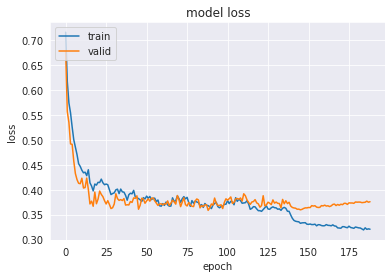

In [20]:
if nas:
    for trial in history: 
        print(trial.summary())
        
    writepath_nas = './results_nas.csv'

    if different_eval_data:
        flat_config = flatten_dict(config_train)
    else:
        flat_config = flatten_dict(config)    

    if not os.path.exists(writepath_nas):
        with open(writepath_nas, 'w+') as text_file:       
            for key in flat_config.keys():
                text_file.write(key)
                text_file.write(';')         

            for hp in history[0].hyperparameters.values.keys():
                text_file.write(hp + ';')    
               
            text_file.write('score')
            
            text_file.write('\n')

    with open(writepath_nas, 'a+') as text_file:  
        for value in flat_config.values():
            text_file.write(str(value))
            text_file.write(';')

        for hp, value in history[0].hyperparameters.values.items():
            text_file.write(str(value) + ';')        

        
        text_file.write(str(history[0].score))
            
        text_file.write('\n')            

        text_file.close()      
        
else:
    plt.plot(history['loss'])
    plt.plot(history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'valid'], loc='upper left')    

In [21]:
if False:
    index = 0
    lambda_net = lambda_net_dataset_train.lambda_net_list[index]
    
    lambda_net_model = network_parameters_to_network(lambda_net.network_parameters, config)
    lambda_net_model_preds = lambda_net_model.predict(lambda_net.X_train_lambda)
    dt_train_data = DecisionTreeClassifier(max_depth=3)
    dt_train_data.fit(lambda_net.X_train_lambda, np.round(lambda_net_model_preds))
    
    random_data = np.random.uniform(0, 1, lambda_net.X_train_lambda.shape)
    lambda_net_model_preds_random = lambda_net_model.predict(random_data)
    dt_random_data = DecisionTreeClassifier(max_depth=3)
    dt_random_data.fit(random_data, np.round(lambda_net_model_preds_random))
    
    plot_decision_area_evaluation(lambda_net.X_train_lambda, 
                                lambda_net.y_train_lambda.flatten(), 
                                lambda_net.X_test_lambda, 
                                lambda_net.y_test_lambda.flatten(),
                                random_data,
                                lambda_net_model_preds_random.flatten(),                                   
                                lambda_net_model,
                                dt_train_data,
                                dt_random_data,
                                dt_random_data,
                                dt_random_data,
                                model.predict(np.array([lambda_net.network_parameters]))[0],
                                np.array([str(i) for i in range(lambda_net.X_train_lambda.shape[1])]),
                                config
                               )

    index = 0
    lambda_net = lambda_net_dataset_valid.lambda_net_list[index]
    
    lambda_net_model = network_parameters_to_network(lambda_net.network_parameters, config)
    lambda_net_model_preds = lambda_net_model.predict(lambda_net.X_train_lambda)
    dt_train_data = DecisionTreeClassifier(max_depth=3)
    dt_train_data.fit(lambda_net.X_train_lambda, np.round(lambda_net_model_preds))
    
    random_data = np.random.uniform(0, 1, lambda_net.X_train_lambda.shape)
    lambda_net_model_preds_random = lambda_net_model.predict(random_data)
    dt_random_data = DecisionTreeClassifier(max_depth=3)
    dt_random_data.fit(random_data, np.round(lambda_net_model_preds_random))
    
    plot_decision_area_evaluation(lambda_net.X_train_lambda, 
                                lambda_net.y_train_lambda.flatten(), 
                                lambda_net.X_test_lambda, 
                                lambda_net.y_test_lambda.flatten(),
                                random_data,
                                lambda_net_model_preds_random.flatten(), 
                                lambda_net_model,
                                dt_train_data,
                                dt_random_data,
                                dt_random_data,
                                dt_random_data,
                                model.predict(np.array([lambda_net.network_parameters]))[0],
                                np.array([str(i) for i in range(lambda_net.X_train_lambda.shape[1])]),
                                config
                               )    

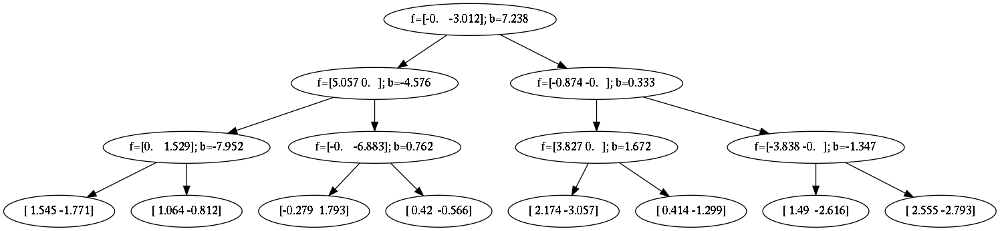

In [22]:
index = 0
if test_size > 0 and not evaluate_distribution:
    network_parameters = np.array([lambda_net_dataset_test.network_parameters_array[index]])
else:
    network_parameters = np.array([lambda_net_dataset_valid.network_parameters_array[index]])
    
if config['i_net']['data_reshape_version'] == 1 or config['i_net']['data_reshape_version'] == 2:
    network_parameters, network_parameters_flat = restructure_data_cnn_lstm(network_parameters, config, subsequences=None)
elif config['i_net']['data_reshape_version'] == 3: #autoencoder
    encoder_model = load_encoder_model(config)
    network_parameters, network_parameters_flat, _ = autoencode_data(network_parameters, config, encoder_model)    
dt_parameters = model.predict(network_parameters)[0]

if config['function_family']['dt_type'] == 'vanilla':
    image, nodes = anytree_decision_tree_from_parameters(dt_parameters, config=config)
else:
    tree = generate_random_decision_tree(config)
    tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
    image = tree.plot_tree()
image

In [23]:
image = None
if not function_value_loss:
    if test_size > 0 and not evaluate_distribution:
        dt_parameters = y_test[index][:-2 ** config['function_family']['maximum_depth'] ]
    else:
        dt_parameters = y_valid[index][:-2 ** config['function_family']['maximum_depth'] ]

    image, nodes = anytree_decision_tree_from_parameters(dt_parameters, config=config)
image

In [24]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 513)]        0           []                               
                                                                                                  
 hidden1_4096 (Dense)           (None, 4096)         2105344     ['input[0][0]']                  
                                                                                                  
 activation1_swish (Activation)  (None, 4096)        0           ['hidden1_4096[0][0]']           
                                                                                                  
 hidden2_2048 (Dense)           (None, 2048)         8390656     ['activation1_swish[0][0]']      
                                                                                              

    Normal: This is useful for looking at means and other linear combinations (e.g. regression coefficients) because of the CLT. Related to that is if something is known to arise due to additive effects of many different small causes then the normal may be a reasonable distribution: for example, many biological measures are the result of multiple genes and multiple environmental factors and therefor are often approximately normal.

    Gamma: Right skewed and useful for things with a natural minimum at 0. Commonly used for elapsed times and some financial variables.

    Exponential: special case of the Gamma. It is memoryless and scales easily.

    Chi-squared (𝜒2): special case of the Gamma. Arises as sum of squared normal variables (so used for variances).

    Beta: Defined between 0 and 1 (but could be transformed to be between other values), useful for proportions or other quantities that must be between 0 and 1.

    Binomial: How many "successes" out of a given number of independent trials with same probability of "success".

    Poisson: Common for counts. Nice properties that if the number of events in a period of time or area follows a Poisson, then the number in twice the time or area still follows the Poisson (with twice the mean): this works for adding Poissons or scaling with values other than 2.

    Note that if events occur over time and the time between occurrences follows an exponential then the number that occur in a time period follows a Poisson.

    Negative Binomial: Counts with minimum 0 (or other value depending on which version) and no upper bound. Conceptually it is the number of "failures" before k "successes". The negative binomial is also a mixture of Poisson variables whose means come from a gamma distribution.

    Geometric: special case for negative binomial where it is the number of "failures" before the 1st "success". If you truncate (round down) an exponential variable to make it discrete, the result is geometric.

## Train & Valid Data Evaluation

In [25]:

mean_train_parameters = np.round(np.mean(lambda_net_dataset_train.network_parameters_array, axis=0), 5)
std_train_parameters = np.round(np.std(lambda_net_dataset_train.network_parameters_array, axis=0), 5)

(inet_evaluation_result_dict_train, 
 inet_evaluation_result_dict_mean_train, 
 dt_distilled_list_train,
 distances_dict) = evaluate_interpretation_net_synthetic_data(lambda_net_dataset_train.network_parameters_array, 
                                                               lambda_net_dataset_train.X_test_lambda_array,
                                                               model,
                                                               config,
                                                               identifier='train',
                                                               mean_train_parameters=mean_train_parameters,
                                                               std_train_parameters=std_train_parameters,
                                                               network_parameters_train_array=lambda_net_dataset_train.network_parameters_array)


(inet_evaluation_result_dict_valid, 
 inet_evaluation_result_dict_mean_valid, 
 dt_distilled_list_valid,
 distances_dict) = evaluate_interpretation_net_synthetic_data(lambda_net_dataset_valid.network_parameters_array, 
                                                               lambda_net_dataset_valid.X_test_lambda_array,
                                                               model,
                                                               config,
                                                               identifier='valid',
                                                               mean_train_parameters=mean_train_parameters,
                                                               std_train_parameters=std_train_parameters,
                                                               network_parameters_train_array=lambda_net_dataset_train.network_parameters_array,
                                                               distances_dict=distances_dict)

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:  8.4min
[Parallel(n_jobs=7)]: Done  50 out of  50 | elapsed: 11.5min finished


  0%|          | 0/50 [00:00<?, ?it/s]

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:  8.6min
[Parallel(n_jobs=7)]: Done  50 out of  50 | elapsed: 11.3min finished


  0%|          | 0/50 [00:00<?, ?it/s]

## Test Data Evaluation (+ Distribution Evaluation)

In [26]:
%load_ext autoreload
%autoreload 2
#set_loky_pickler('pickle')

In [27]:
#config['computation']['n_jobs'] = 60
#config['i_net']['test_size'] = 1000

In [28]:
if evaluate_distribution and test_size > 0:
    
    (distances_dict, 
     inet_evaluation_result_dict_test, 
     inet_evaluation_result_dict_complete_by_distribution_test,
     inet_evaluation_result_dict_mean_test,
     inet_evaluation_result_dict_mean_by_distribution_test,
     inet_evaluation_results_test, 
     dt_inet_list_test, 
     dt_distilled_list_test, 
     data_dict_list_test, 
     normalizer_list_list_test,
     test_network_list_distrib,
     model_history_list,
     distribution_parameter_list_list) = distribution_evaluation_interpretation_net_synthetic_data(loss_function, 
                                                                                            metrics,
                                                                                            #model,
                                                                                           config,
                                                                                           distribution_list_evaluation = config['data']['distribution_list_eval'],#['uniform', 'normal', 'gamma', 'exponential', 'beta', 'binomial', 'poisson'],
                                                                                           identifier='test',
                                                                                           lambda_net_parameters_train=lambda_net_dataset_train.network_parameters_array,
                                                                                           mean_train_parameters=mean_train_parameters,
                                                                                           std_train_parameters=std_train_parameters,
                                                                                           distances_dict=distances_dict,
                                                                                           max_distributions_per_class=max_distributions_per_class,#max_distributions_per_class,
                                                                                           flip_percentage=noise_injected_level, #0.1,#
                                                                                           data_noise=data_noise, #0.1,#
                                                                                           random_parameters = random_parameters_distribution, #random_parameters_distribution
                                                                                           verbose=0,
                                                                                           backend='loky',#sequential
                                                                                    )
else:
    (inet_evaluation_result_dict_test, 
     inet_evaluation_result_dict_mean_test, 
     dt_distilled_list_test,
     distances_dict) = evaluate_interpretation_net_synthetic_data(lambda_net_dataset_test.network_parameters_array, 
                                                                   lambda_net_dataset_test.X_test_lambda_array,
                                                                   model,
                                                                   config,
                                                                   identifier='test',
                                                                   mean_train_parameters=mean_train_parameters,
                                                                   std_train_parameters=std_train_parameters,
                                                                   network_parameters_train_array=lambda_net_dataset_train.network_parameters_array,
                                                                   distances_dict=distances_dict)
    
    print_results_synthetic_evaluation(inet_evaluation_result_dict_mean_train, 
                                       inet_evaluation_result_dict_mean_valid, 
                                       inet_evaluation_result_dict_mean_test, 
                                       distances_dict)    

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  18 tasks      | elapsed: 17.6min
[Parallel(n_jobs=7)]: Done 100 out of 100 | elapsed: 58.6min finished


In [29]:
if evaluate_distribution and test_size > 0:
    #print(distribution_parameter_list_list[0])
    #print(lambda_net_dataset_valid.distribution_dict_list_list[0])

    inet_performance_distrib_evaluation = np.array(inet_evaluation_result_dict_complete_by_distribution_test[list(inet_evaluation_result_dict_complete_by_distribution_test.keys())[0]]['inet_scores']['accuracy'])
    print('I-Net Performance by Network: ', inet_performance_distrib_evaluation)

    mean_random_performance_distrib_evaluation = np.mean(np.array([inet_evaluation_result_dict_complete_by_distribution_test[str(distrib)]['dt_scores']['accuracy'] for distrib in config['data']['distribution_list_eval']]), axis=0)
    print('Distilled Mean Performance by Network: ', mean_random_performance_distrib_evaluation)

    max_random_performance_distrib_evaluation = np.max(np.array([inet_evaluation_result_dict_complete_by_distribution_test[str(distrib)]['dt_scores']['accuracy'] for distrib in config['data']['distribution_list_eval']]), axis=0)
    print('Distilled Max Performance by Network: ', max_random_performance_distrib_evaluation)

    print('Median I-Net:', np.median(inet_evaluation_result_dict_complete_by_distribution_test[list(inet_evaluation_result_dict_complete_by_distribution_test.keys())[0]]['inet_scores']['accuracy']))
    print('Median DT Distilled:', np.median(np.median(np.array([inet_evaluation_result_dict_complete_by_distribution_test[str(distrib)]['dt_scores']['accuracy'] for distrib in config['data']['distribution_list_eval']]), axis=0)))#np.median(inet_evaluation_result_dict_complete_by_distribution_test['uniform']['dt_scores']['accuracy']))

    complete_distribution_evaluation_results = get_complete_distribution_evaluation_results_dataframe(inet_evaluation_result_dict_mean_by_distribution_test)
    display(complete_distribution_evaluation_results.head(20))
    
    network_distances = get_print_network_distances_dataframe(distances_dict)
    display(network_distances.head(20))

I-Net Performance by Network:  [0.83  0.762 1.    0.848 0.724 0.816 0.974 0.984 0.73  0.906 0.964 1.
 0.846 0.796 0.904 0.982 0.974 0.896 0.976 0.872 0.998 0.948 0.996 0.96
 0.84  0.548 0.99  0.794 0.754 0.928 0.76  0.232 0.974 0.874 0.674 0.804
 0.776 0.908 0.944 0.402 0.916 0.968 0.866 0.866 0.62  0.928 0.958 0.944
 0.632 0.984 0.924 0.866 0.876 0.948 1.    1.    1.    1.    0.696 1.
 0.542 0.448 0.98  0.75  0.704 1.    0.962 0.91  0.982 0.85  0.8   0.81
 1.    0.898 0.908 0.988 0.99  0.85  0.814 0.956 0.976 0.814 0.836 1.
 0.662 0.82  0.992 0.82  1.    0.604 0.956 0.992 0.942 0.846 0.978 0.446
 0.91  0.83  0.838 0.672]
Distilled Mean Performance by Network:  [0.766 0.268 0.54  0.356 0.276 0.376 0.81  0.686 0.696 0.832 0.606 0.786
 0.286 0.818 0.428 0.932 0.514 0.82  0.96  0.486 0.468 0.78  0.344 0.834
 0.828 0.482 0.84  0.392 0.316 0.49  0.344 0.334 0.854 0.396 0.264 0.496
 0.214 0.334 0.458 0.644 0.484 0.684 0.77  0.262 0.558 0.328 0.556 0.712
 0.382 0.688 0.514 0.376 0.55  0.952 0

,Acc Distilled Train Data,Acc Distilled Data Random,Acc Distilled,Acc I-Net,Soft BC Distilled Train Data,Soft BC Distilled Data Random,Soft BC Distilled,Soft BC I-Net,BC Distilled Train Data,BC Distilled Data Random,BC Distilled,BC I-Net,F1 Score Distilled Train Data,F1 Score Distilled Data Random,F1 Score Distilled,F1 Score I-Net,ROC AUC Score Distilled Train Data,ROC AUC Score Distilled Data Random,ROC AUC Score Distilled,ROC AUC Score I-Net,Runtime Distilled Train Data,Runtime Distilled Data Random,Runtime Distilled,Runtime I-Net
"['uniform', 'normal', 'gamma', 'beta', 'poisson']",0.725,0.900,0.580,0.860,0.664,0.531,0.715,0.603,0.521,0.273,1.027,0.338,0.660,0.879,0.481,0.840,0.702,0.679,0.606,0.897,61.342,61.342,61.342,0.427


,Average Z-Score (Sample to Train Data),Average Distance to Initialization,Average Mean Distance to Train Data,Average Distance to closest Train Data Sample,Average Biggest Distance for Single Neuron,Minimum Biggest Distance for Single Neuron
train,217.278,92.099,143.633,0.000,4.123,0.000
valid,231.446,101.146,149.109,49.145,4.417,1.532
test,241.344,110.764,159.214,43.849,4.628,1.775


In [30]:
#%load_ext autoreload
#%autoreload 2

In [113]:
print('A')

A


Index:  59
Feature 1:  Samples 4274 / 726
	 Distribution 1: poisson
		 lam: 3.462
	 Distribution 2: poisson
		 lam: 3.968
Feature 2:  Samples 3933 / 1067
	 Distribution 1: uniform
		 low: 2.565
		 high: 3.39
	 Distribution 2: uniform
		 low: 0.468
		 high: 1.915
Considered Columns:								 0   1
Performance Network:								 0.708
Fidelity DT Sklearn Train Data:							 0.874
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.182
Fidelity DT Sklearn Uniform Data:						 0.182
Fidelity DT Sklearn Normal Data:						 0.182
Fidelity DT I-Net:								 1.0


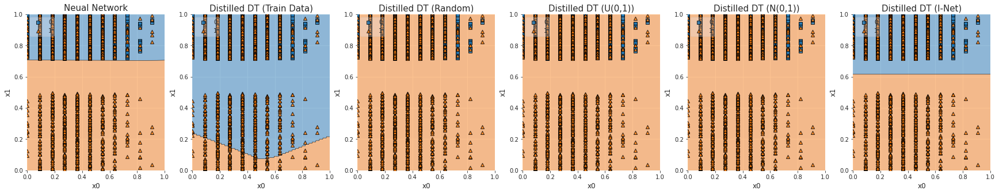

-----------------------------------------------------
Index:  76
Feature 1:  Samples 2722 / 2278
	 Distribution 1: uniform
		 low: 3.211
		 high: 4.596
	 Distribution 2: uniform
		 low: 2.855
		 high: 4.512
Feature 2:  Samples 1078 / 3922
	 Distribution 1: uniform
		 low: 2.539
		 high: 3.153
	 Distribution 2: uniform
		 low: 3.873
		 high: 3.95
Considered Columns:								 0   1
Performance Network:								 0.726
Fidelity DT Sklearn Train Data:							 0.824
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.26
Fidelity DT Sklearn Uniform Data:						 0.26
Fidelity DT Sklearn Normal Data:						 0.26
Fidelity DT I-Net:								 0.99


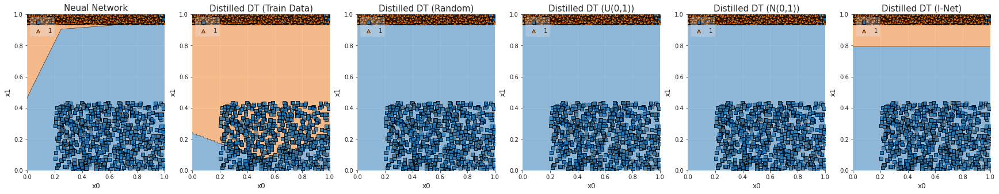

-----------------------------------------------------
Index:  22
Feature 1:  Samples 2934 / 2066
	 Distribution 1: poisson
		 lam: 0.012
	 Distribution 2: poisson
		 lam: 2.06
Feature 2:  Samples 1564 / 3436
	 Distribution 1: normal
		 loc: 1.245
		 scale: 3.79
	 Distribution 2: normal
		 loc: 4.159
		 scale: 2.217
Considered Columns:								 0   1
Performance Network:								 0.854
Fidelity DT Sklearn Train Data:							 0.656
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.344
Fidelity DT Sklearn Uniform Data:						 0.344
Fidelity DT Sklearn Normal Data:						 0.344
Fidelity DT I-Net:								 0.996


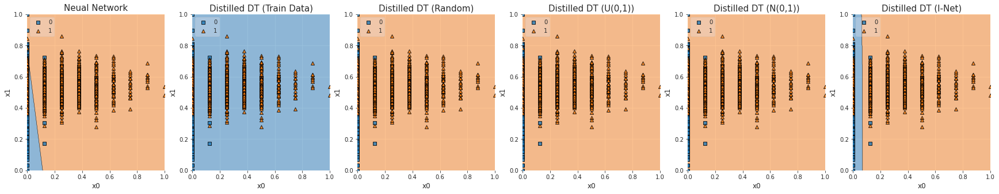

-----------------------------------------------------
Index:  72
Feature 1:  Samples 4569 / 431
	 Distribution 1: beta
		 a: 2.86
		 b: 3.863
	 Distribution 2: beta
		 a: 2.578
		 b: 3.05
Feature 2:  Samples 1750 / 3250
	 Distribution 1: uniform
		 low: 2.491
		 high: 3.095
	 Distribution 2: uniform
		 low: 3.606
		 high: 3.824
Considered Columns:								 0   1
Performance Network:								 0.862
Fidelity DT Sklearn Train Data:							 0.714
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.388
Fidelity DT Sklearn Uniform Data:						 0.388
Fidelity DT Sklearn Normal Data:						 0.388
Fidelity DT I-Net:								 1.0


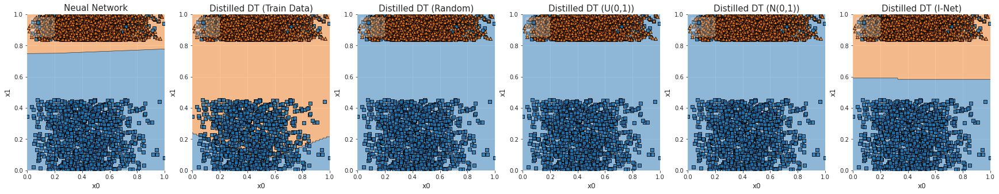

-----------------------------------------------------
Index:  85
Feature 1:  Samples 4459 / 541
	 Distribution 1: uniform
		 low: 1.013
		 high: 1.035
	 Distribution 2: uniform
		 low: 0.162
		 high: 3.767
Feature 2:  Samples 3911 / 1089
	 Distribution 1: beta
		 a: 1.608
		 b: 1.274
	 Distribution 2: beta
		 a: 2.447
		 b: 1.005
Considered Columns:								 0   1
Performance Network:								 0.63
Fidelity DT Sklearn Train Data:							 0.772
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.228
Fidelity DT Sklearn Uniform Data:						 0.228
Fidelity DT Sklearn Normal Data:						 0.228
Fidelity DT I-Net:								 0.82


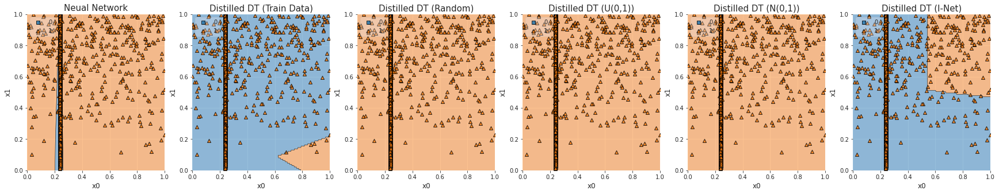

-----------------------------------------------------
Index:  12
Feature 1:  Samples 1415 / 3585
	 Distribution 1: normal
		 loc: 4.121
		 scale: 4.829
	 Distribution 2: normal
		 loc: 0.799
		 scale: 1.542
Feature 2:  Samples 36 / 4964
	 Distribution 1: normal
		 loc: 3.841
		 scale: 3.946
	 Distribution 2: normal
		 loc: 4.121
		 scale: 3.299
Considered Columns:								 0   1
Performance Network:								 0.66
Fidelity DT Sklearn Train Data:							 0.716
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.286
Fidelity DT Sklearn Uniform Data:						 0.286
Fidelity DT Sklearn Normal Data:						 0.288
Fidelity DT I-Net:								 0.846


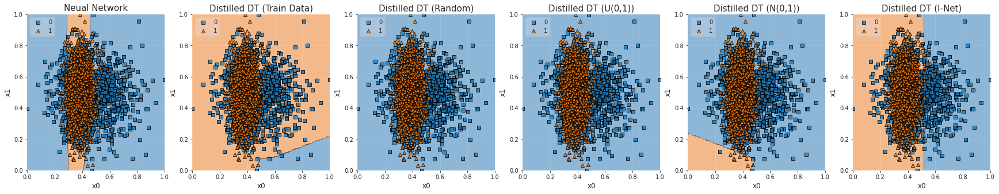

-----------------------------------------------------
Index:  73
Feature 1:  Samples 147 / 4853
	 Distribution 1: gamma
		 shape: 1.244
		 scale: 4.052
	 Distribution 2: gamma
		 shape: 0.633
		 scale: 1.474
Feature 2:  Samples 767 / 4233
	 Distribution 1: uniform
		 low: 0.702
		 high: 2.877
	 Distribution 2: uniform
		 low: 0.061
		 high: 2.2
Considered Columns:								 0   1
Performance Network:								 0.572
Fidelity DT Sklearn Train Data:							 0.658
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.342
Fidelity DT Sklearn Uniform Data:						 0.342
Fidelity DT Sklearn Normal Data:						 0.342
Fidelity DT I-Net:								 0.898


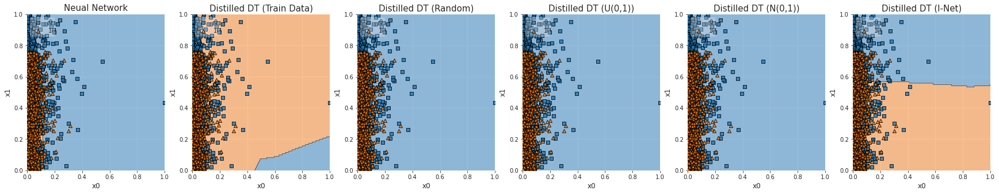

-----------------------------------------------------
Index:  20
Feature 1:  Samples 2523 / 2477
	 Distribution 1: poisson
		 lam: 0.348
	 Distribution 2: poisson
		 lam: 4.827
Feature 2:  Samples 2719 / 2281
	 Distribution 1: beta
		 a: 4.331
		 b: 3.006
	 Distribution 2: beta
		 a: 3.58
		 b: 3.909
Considered Columns:								 0   1
Performance Network:								 0.958
Fidelity DT Sklearn Train Data:							 0.532
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.468
Fidelity DT Sklearn Uniform Data:						 0.468
Fidelity DT Sklearn Normal Data:						 0.468
Fidelity DT I-Net:								 0.998


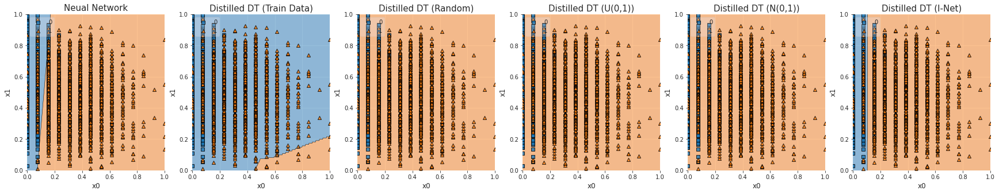

-----------------------------------------------------
Index:  21
Feature 1:  Samples 773 / 4227
	 Distribution 1: uniform
		 low: 1.042
		 high: 2.408
	 Distribution 2: uniform
		 low: 2.876
		 high: 3.04
Feature 2:  Samples 1534 / 3466
	 Distribution 1: beta
		 a: 2.045
		 b: 2.55
	 Distribution 2: beta
		 a: 3.752
		 b: 4.55
Considered Columns:								 0   1
Performance Network:								 0.672
Fidelity DT Sklearn Train Data:							 0.78
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.78
Fidelity DT Sklearn Uniform Data:						 0.242
Fidelity DT Sklearn Normal Data:						 0.242
Fidelity DT I-Net:								 0.948


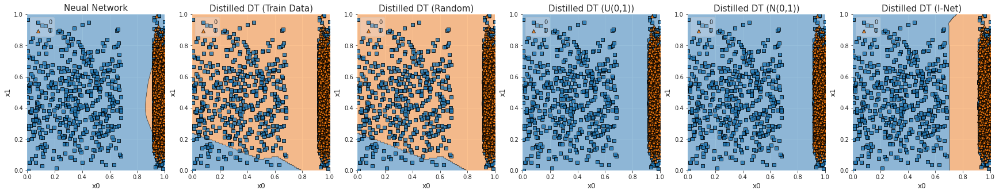

-----------------------------------------------------
Index:  1
Feature 1:  Samples 236 / 4764
	 Distribution 1: poisson
		 lam: 3.106
	 Distribution 2: poisson
		 lam: 1.49
Feature 2:  Samples 160 / 4840
	 Distribution 1: normal
		 loc: 4.863
		 scale: 3.574
	 Distribution 2: normal
		 loc: 0.971
		 scale: 0.287
Considered Columns:								 0   1
Performance Network:								 0.522
Fidelity DT Sklearn Train Data:							 0.732
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.268
Fidelity DT Sklearn Uniform Data:						 0.268
Fidelity DT Sklearn Normal Data:						 0.268
Fidelity DT I-Net:								 0.762


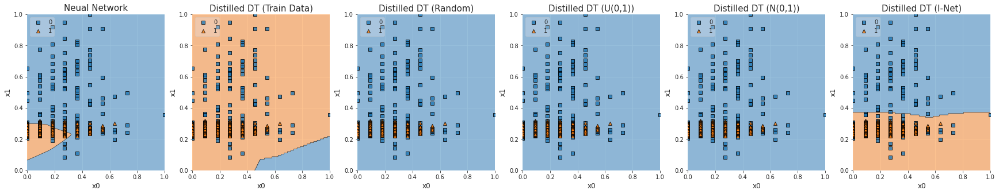

-----------------------------------------------------
Index:  3
Feature 1:  Samples 1689 / 3311
	 Distribution 1: normal
		 loc: 4.863
		 scale: 3.574
	 Distribution 2: normal
		 loc: 0.971
		 scale: 0.287
Feature 2:  Samples 1111 / 3889
	 Distribution 1: gamma
		 shape: 1.164
		 scale: 0.057
	 Distribution 2: gamma
		 shape: 0.157
		 scale: 1.497
Considered Columns:								 0   1
Performance Network:								 0.798
Fidelity DT Sklearn Train Data:							 0.858
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.356
Fidelity DT Sklearn Uniform Data:						 0.356
Fidelity DT Sklearn Normal Data:						 0.356
Fidelity DT I-Net:								 0.848


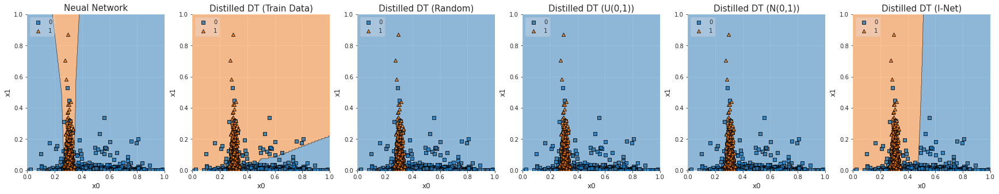

-----------------------------------------------------
Index:  15
Feature 1:  Samples 3830 / 1170
	 Distribution 1: poisson
		 lam: 2.818
	 Distribution 2: poisson
		 lam: 3.305
Feature 2:  Samples 866 / 4134
	 Distribution 1: gamma
		 shape: 3.683
		 scale: 4.081
	 Distribution 2: gamma
		 shape: 0.078
		 scale: 3.267
Considered Columns:								 0   1
Performance Network:								 0.676
Fidelity DT Sklearn Train Data:							 0.934
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.932
Fidelity DT Sklearn Uniform Data:						 0.336
Fidelity DT Sklearn Normal Data:						 0.23
Fidelity DT I-Net:								 0.982


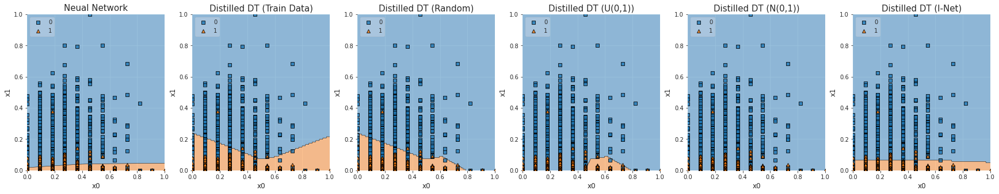

-----------------------------------------------------
Index:  54
Feature 1:  Samples 899 / 4101
	 Distribution 1: normal
		 loc: 2.419
		 scale: 1.213
	 Distribution 2: normal
		 loc: 1.329
		 scale: 4.283
Feature 2:  Samples 1424 / 3576
	 Distribution 1: poisson
		 lam: 1.937
	 Distribution 2: poisson
		 lam: 0.021
Considered Columns:								 0   1
Performance Network:								 0.752
Fidelity DT Sklearn Train Data:							 0.984
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.98
Fidelity DT Sklearn Uniform Data:						 0.294
Fidelity DT Sklearn Normal Data:						 0.294
Fidelity DT I-Net:								 1.0


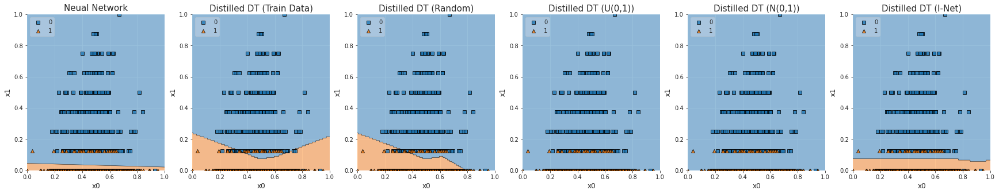

-----------------------------------------------------
Index:  67
Feature 1:  Samples 2884 / 2116
	 Distribution 1: gamma
		 shape: 3.054
		 scale: 1.482
	 Distribution 2: gamma
		 shape: 2.165
		 scale: 2.316
Feature 2:  Samples 4531 / 469
	 Distribution 1: uniform
		 low: 0.741
		 high: 0.766
	 Distribution 2: uniform
		 low: 2.353
		 high: 2.708
Considered Columns:								 0   1
Performance Network:								 0.632
Fidelity DT Sklearn Train Data:							 0.962
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.962
Fidelity DT Sklearn Uniform Data:						 0.178
Fidelity DT Sklearn Normal Data:						 0.178
Fidelity DT I-Net:								 0.91


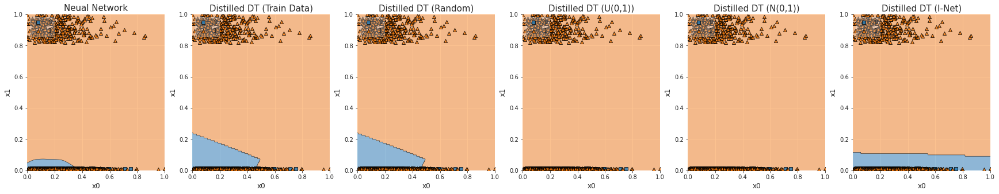

-----------------------------------------------------
Index:  79
Feature 1:  Samples 2392 / 2608
	 Distribution 1: gamma
		 shape: 4.54
		 scale: 3.426
	 Distribution 2: gamma
		 shape: 3.647
		 scale: 0.545
Feature 2:  Samples 1169 / 3831
	 Distribution 1: beta
		 a: 1.959
		 b: 1.514
	 Distribution 2: beta
		 a: 0.47
		 b: 1.889
Considered Columns:								 0   1
Performance Network:								 0.954
Fidelity DT Sklearn Train Data:							 0.702
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.492
Fidelity DT Sklearn Uniform Data:						 0.492
Fidelity DT Sklearn Normal Data:						 0.492
Fidelity DT I-Net:								 0.956


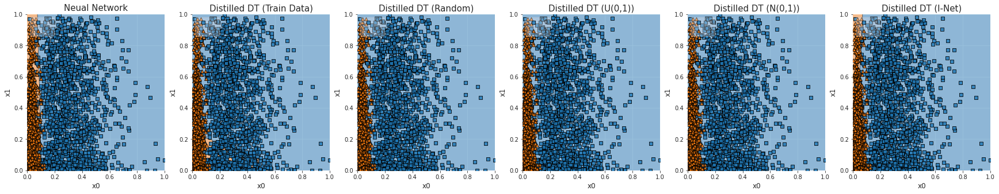

-----------------------------------------------------
Index:  16
Feature 1:  Samples 2170 / 2830
	 Distribution 1: normal
		 loc: 0.958
		 scale: 0.34
	 Distribution 2: normal
		 loc: 4.711
		 scale: 2.084
Feature 2:  Samples 4159 / 841
	 Distribution 1: beta
		 a: 1.265
		 b: 0.95
	 Distribution 2: beta
		 a: 1.716
		 b: 2.178
Considered Columns:								 0   1
Performance Network:								 0.9
Fidelity DT Sklearn Train Data:							 0.548
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.514
Fidelity DT Sklearn Uniform Data:						 0.514
Fidelity DT Sklearn Normal Data:						 0.514
Fidelity DT I-Net:								 0.974


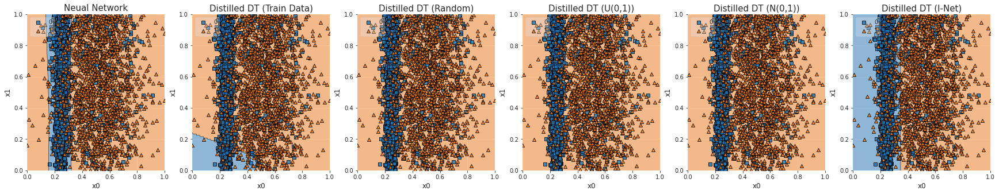

-----------------------------------------------------
Index:  4
Feature 1:  Samples 1147 / 3853
	 Distribution 1: normal
		 loc: 1.034
		 scale: 4.593
	 Distribution 2: normal
		 loc: 4.693
		 scale: 0.683
Feature 2:  Samples 4726 / 274
	 Distribution 1: uniform
		 low: 0.104
		 high: 3.857
	 Distribution 2: uniform
		 low: 4.502
		 high: 4.923
Considered Columns:								 0   1
Performance Network:								 0.674
Fidelity DT Sklearn Train Data:							 0.754
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.276
Fidelity DT Sklearn Uniform Data:						 0.276
Fidelity DT Sklearn Normal Data:						 0.276
Fidelity DT I-Net:								 0.724


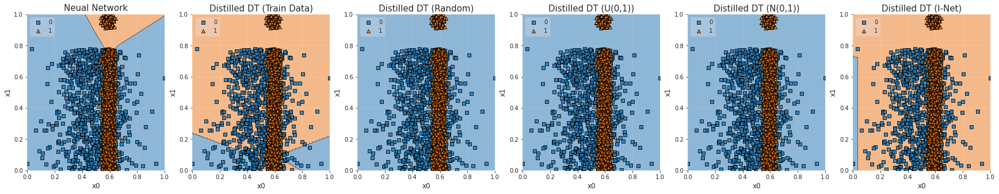

-----------------------------------------------------
Index:  94
Feature 1:  Samples 2748 / 2252
	 Distribution 1: gamma
		 shape: 2.665
		 scale: 4.347
	 Distribution 2: gamma
		 shape: 1.359
		 scale: 1.575
Feature 2:  Samples 3821 / 1179
	 Distribution 1: beta
		 a: 4.644
		 b: 2.553
	 Distribution 2: beta
		 a: 1.557
		 b: 1.261
Considered Columns:								 0   1
Performance Network:								 0.876
Fidelity DT Sklearn Train Data:							 0.564
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.534
Fidelity DT Sklearn Uniform Data:						 0.534
Fidelity DT Sklearn Normal Data:						 0.534
Fidelity DT I-Net:								 0.978


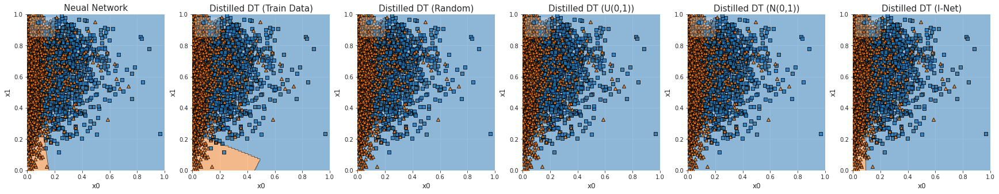

-----------------------------------------------------
Index:  43
Feature 1:  Samples 3393 / 1607
	 Distribution 1: normal
		 loc: 3.723
		 scale: 1.803
	 Distribution 2: normal
		 loc: 1.02
		 scale: 3.943
Feature 2:  Samples 3250 / 1750
	 Distribution 1: normal
		 loc: 2.642
		 scale: 4.481
	 Distribution 2: normal
		 loc: 4.241
		 scale: 2.729
Considered Columns:								 0   1
Performance Network:								 0.646
Fidelity DT Sklearn Train Data:							 0.744
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.262
Fidelity DT Sklearn Uniform Data:						 0.262
Fidelity DT Sklearn Normal Data:						 0.744
Fidelity DT I-Net:								 0.866


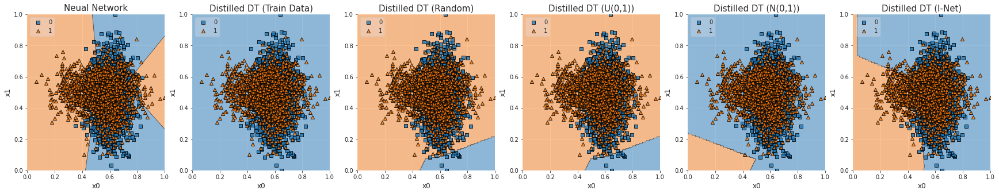

-----------------------------------------------------
Index:  65
Feature 1:  Samples 2166 / 2834
	 Distribution 1: uniform
		 low: 0.668
		 high: 0.771
	 Distribution 2: uniform
		 low: 1.463
		 high: 2.253
Feature 2:  Samples 4169 / 831
	 Distribution 1: normal
		 loc: 4.143
		 scale: 3.908
	 Distribution 2: normal
		 loc: 3.495
		 scale: 3.392
Considered Columns:								 0   1
Performance Network:								 0.93
Fidelity DT Sklearn Train Data:							 0.566
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.566
Fidelity DT Sklearn Uniform Data:						 0.566
Fidelity DT Sklearn Normal Data:						 0.544
Fidelity DT I-Net:								 1.0


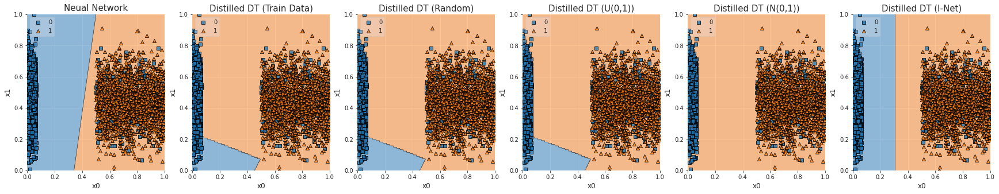

-----------------------------------------------------
Index:  28
Feature 1:  Samples 1282 / 3718
	 Distribution 1: normal
		 loc: 0.366
		 scale: 3.816
	 Distribution 2: normal
		 loc: 1.913
		 scale: 0.572
Feature 2:  Samples 947 / 4053
	 Distribution 1: beta
		 a: 1.874
		 b: 4.079
	 Distribution 2: beta
		 a: 2.777
		 b: 2.634
Considered Columns:								 0   1
Performance Network:								 0.714
Fidelity DT Sklearn Train Data:							 0.702
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.316
Fidelity DT Sklearn Uniform Data:						 0.316
Fidelity DT Sklearn Normal Data:						 0.316
Fidelity DT I-Net:								 0.754


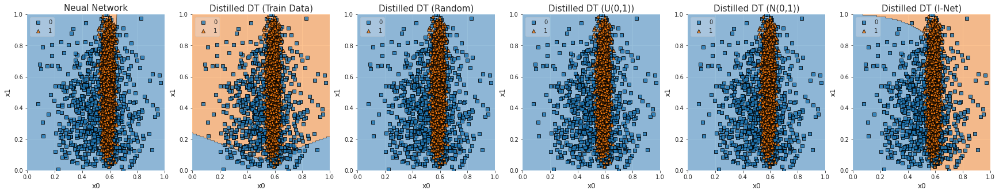

-----------------------------------------------------
Index:  70
Feature 1:  Samples 4311 / 689
	 Distribution 1: gamma
		 shape: 4.583
		 scale: 3.942
	 Distribution 2: gamma
		 shape: 3.926
		 scale: 4.162
Feature 2:  Samples 1699 / 3301
	 Distribution 1: normal
		 loc: 3.28
		 scale: 4.162
	 Distribution 2: normal
		 loc: 0.326
		 scale: 0.18
Considered Columns:								 0   1
Performance Network:								 0.832
Fidelity DT Sklearn Train Data:							 0.642
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.366
Fidelity DT Sklearn Uniform Data:						 0.366
Fidelity DT Sklearn Normal Data:						 0.366
Fidelity DT I-Net:								 0.8


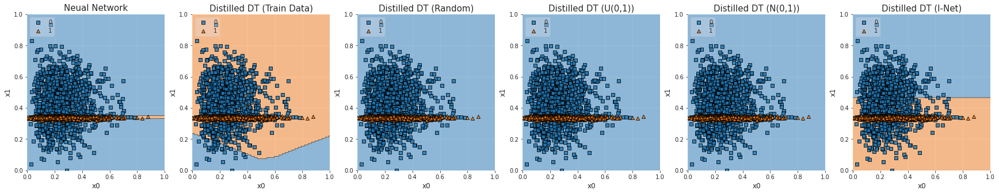

-----------------------------------------------------
Index:  88
Feature 1:  Samples 2009 / 2991
	 Distribution 1: uniform
		 low: 1.28
		 high: 2.498
	 Distribution 2: uniform
		 low: 2.466
		 high: 2.897
Feature 2:  Samples 2705 / 2295
	 Distribution 1: uniform
		 low: 0.192
		 high: 2.623
	 Distribution 2: uniform
		 low: 2.873
		 high: 4.099
Considered Columns:								 0   1
Performance Network:								 0.958
Fidelity DT Sklearn Train Data:							 0.57
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.568
Fidelity DT Sklearn Uniform Data:						 0.568
Fidelity DT Sklearn Normal Data:						 0.568
Fidelity DT I-Net:								 1.0


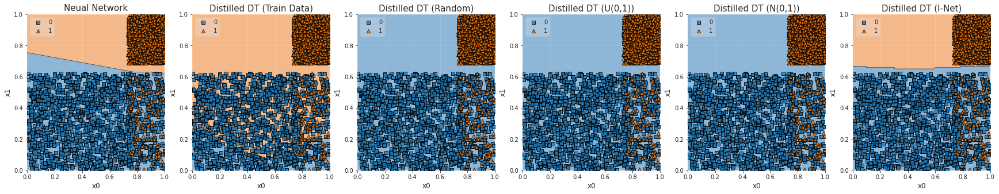

-----------------------------------------------------
Index:  57
Feature 1:  Samples 3024 / 1976
	 Distribution 1: uniform
		 low: 1.826
		 high: 2.256
	 Distribution 2: uniform
		 low: 2.554
		 high: 2.666
Feature 2:  Samples 3442 / 1558
	 Distribution 1: beta
		 a: 2.39
		 b: 1.809
	 Distribution 2: beta
		 a: 2.71
		 b: 4.767
Considered Columns:								 0   1
Performance Network:								 0.884
Fidelity DT Sklearn Train Data:							 0.686
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.368
Fidelity DT Sklearn Uniform Data:						 0.686
Fidelity DT Sklearn Normal Data:						 0.686
Fidelity DT I-Net:								 1.0


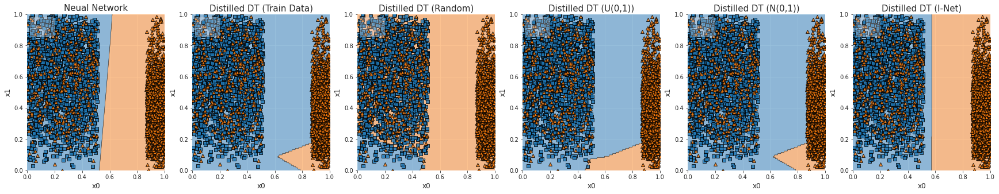

-----------------------------------------------------
Index:  30
Feature 1:  Samples 4518 / 482
	 Distribution 1: poisson
		 lam: 0.447
	 Distribution 2: poisson
		 lam: 4.157
Feature 2:  Samples 3507 / 1493
	 Distribution 1: poisson
		 lam: 3.229
	 Distribution 2: poisson
		 lam: 2.056
Considered Columns:								 0   1
Performance Network:								 0.602
Fidelity DT Sklearn Train Data:							 0.66
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.344
Fidelity DT Sklearn Uniform Data:						 0.344
Fidelity DT Sklearn Normal Data:						 0.344
Fidelity DT I-Net:								 0.76


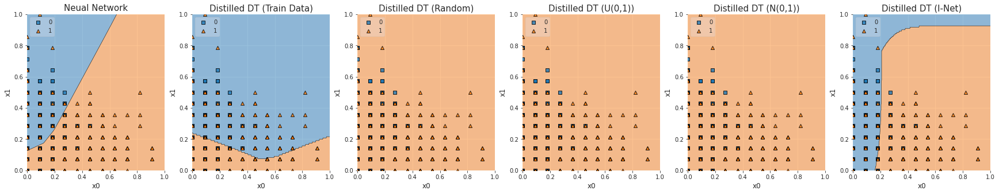

-----------------------------------------------------
Index:  34
Feature 1:  Samples 3490 / 1510
	 Distribution 1: gamma
		 shape: 4.086
		 scale: 0.557
	 Distribution 2: gamma
		 shape: 0.819
		 scale: 3.86
Feature 2:  Samples 144 / 4856
	 Distribution 1: poisson
		 lam: 1.816
	 Distribution 2: poisson
		 lam: 3.785
Considered Columns:								 0   1
Performance Network:								 0.63
Fidelity DT Sklearn Train Data:							 0.736
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.264
Fidelity DT Sklearn Uniform Data:						 0.264
Fidelity DT Sklearn Normal Data:						 0.264
Fidelity DT I-Net:								 0.674


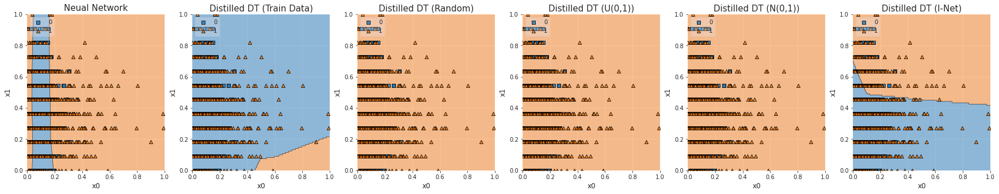

-----------------------------------------------------
Index:  38
Feature 1:  Samples 3916 / 1084
	 Distribution 1: beta
		 a: 2.357
		 b: 3.164
	 Distribution 2: beta
		 a: 0.792
		 b: 3.862
Feature 2:  Samples 1293 / 3707
	 Distribution 1: beta
		 a: 1.233
		 b: 0.251
	 Distribution 2: beta
		 a: 1.971
		 b: 3.894
Considered Columns:								 0   1
Performance Network:								 0.724
Fidelity DT Sklearn Train Data:							 0.686
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.458
Fidelity DT Sklearn Uniform Data:						 0.458
Fidelity DT Sklearn Normal Data:						 0.686
Fidelity DT I-Net:								 0.944


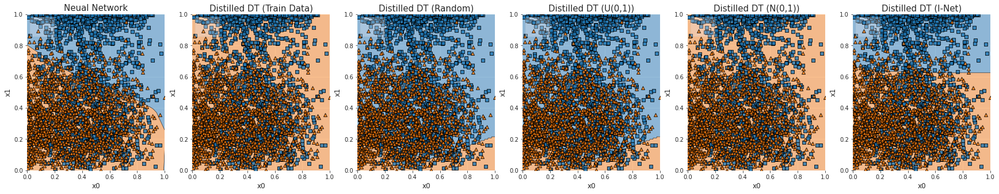

-----------------------------------------------------
Index:  68
Feature 1:  Samples 2880 / 2120
	 Distribution 1: gamma
		 shape: 2.807
		 scale: 1.268
	 Distribution 2: gamma
		 shape: 4.739
		 scale: 0.096
Feature 2:  Samples 887 / 4113
	 Distribution 1: beta
		 a: 0.976
		 b: 4.615
	 Distribution 2: beta
		 a: 3.096
		 b: 1.947
Considered Columns:								 0   1
Performance Network:								 0.898
Fidelity DT Sklearn Train Data:							 0.542
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.576
Fidelity DT Sklearn Uniform Data:						 0.576
Fidelity DT Sklearn Normal Data:						 0.576
Fidelity DT I-Net:								 0.982


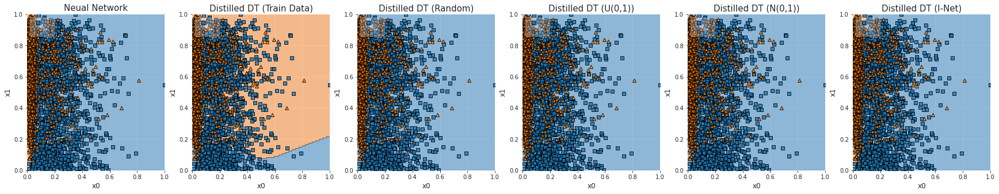

-----------------------------------------------------
Index:  50
Feature 1:  Samples 1932 / 3068
	 Distribution 1: normal
		 loc: 1.717
		 scale: 3.22
	 Distribution 2: normal
		 loc: 3.851
		 scale: 3.373
Feature 2:  Samples 4714 / 286
	 Distribution 1: beta
		 a: 1.561
		 b: 1.79
	 Distribution 2: beta
		 a: 3.929
		 b: 4.034
Considered Columns:								 0   1
Performance Network:								 0.592
Fidelity DT Sklearn Train Data:							 0.528
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.514
Fidelity DT Sklearn Uniform Data:						 0.528
Fidelity DT Sklearn Normal Data:						 0.514
Fidelity DT I-Net:								 0.924


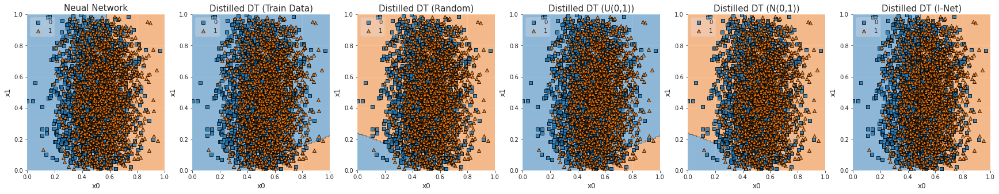

-----------------------------------------------------
Index:  64
Feature 1:  Samples 3239 / 1761
	 Distribution 1: normal
		 loc: 1.436
		 scale: 0.863
	 Distribution 2: normal
		 loc: 2.765
		 scale: 2.857
Feature 2:  Samples 4701 / 299
	 Distribution 1: normal
		 loc: 2.774
		 scale: 0.629
	 Distribution 2: normal
		 loc: 1.742
		 scale: 0.122
Considered Columns:								 0   1
Performance Network:								 0.674
Fidelity DT Sklearn Train Data:							 0.7
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.3
Fidelity DT Sklearn Uniform Data:						 0.3
Fidelity DT Sklearn Normal Data:						 0.3
Fidelity DT I-Net:								 0.704


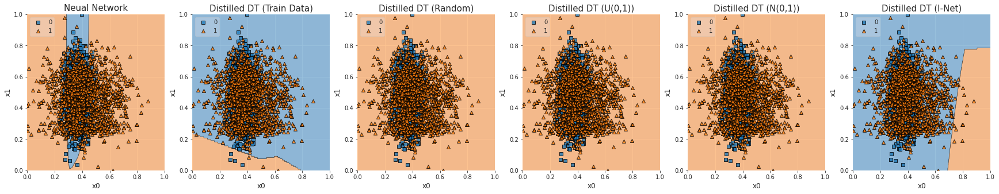

-----------------------------------------------------
Index:  14
Feature 1:  Samples 2668 / 2332
	 Distribution 1: uniform
		 low: 0.894
		 high: 4.244
	 Distribution 2: uniform
		 low: 1.096
		 high: 1.854
Feature 2:  Samples 3506 / 1494
	 Distribution 1: poisson
		 lam: 0.681
	 Distribution 2: poisson
		 lam: 2.515
Considered Columns:								 0   1
Performance Network:								 0.838
Fidelity DT Sklearn Train Data:							 0.792
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.428
Fidelity DT Sklearn Uniform Data:						 0.648
Fidelity DT Sklearn Normal Data:						 0.428
Fidelity DT I-Net:								 0.904


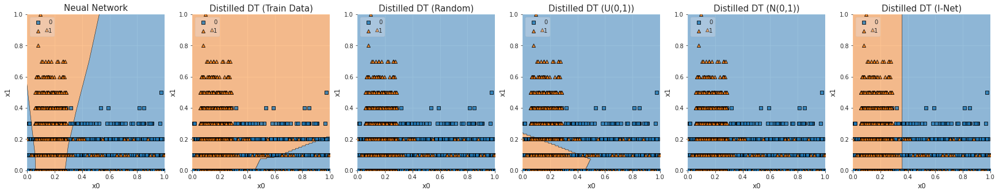

-----------------------------------------------------
Index:  51
Feature 1:  Samples 2106 / 2894
	 Distribution 1: uniform
		 low: 0.131
		 high: 4.116
	 Distribution 2: uniform
		 low: 2.862
		 high: 3.36
Feature 2:  Samples 1619 / 3381
	 Distribution 1: gamma
		 shape: 0.929
		 scale: 3.861
	 Distribution 2: gamma
		 shape: 1.344
		 scale: 4.237
Considered Columns:								 0   1
Performance Network:								 0.85
Fidelity DT Sklearn Train Data:							 0.776
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.376
Fidelity DT Sklearn Uniform Data:						 0.376
Fidelity DT Sklearn Normal Data:						 0.638
Fidelity DT I-Net:								 0.866


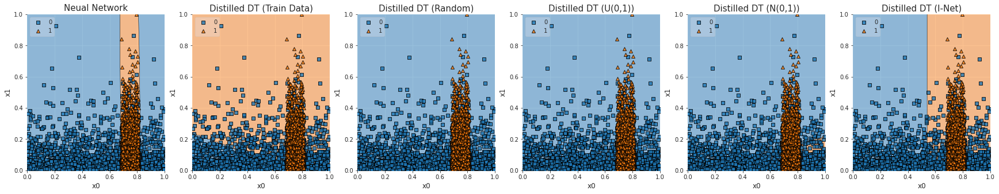

-----------------------------------------------------
Index:  47
Feature 1:  Samples 1927 / 3073
	 Distribution 1: uniform
		 low: 0.087
		 high: 4.458
	 Distribution 2: uniform
		 low: 2.896
		 high: 4.731
Feature 2:  Samples 956 / 4044
	 Distribution 1: beta
		 a: 2.81
		 b: 2.857
	 Distribution 2: beta
		 a: 1.487
		 b: 3.435
Considered Columns:								 0   1
Performance Network:								 0.714
Fidelity DT Sklearn Train Data:							 0.728
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.712
Fidelity DT Sklearn Uniform Data:						 0.46
Fidelity DT Sklearn Normal Data:						 0.46
Fidelity DT I-Net:								 0.944


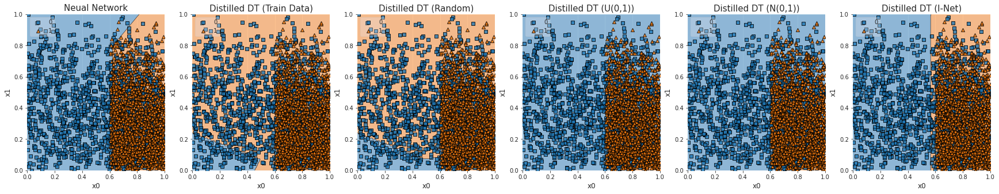

-----------------------------------------------------
Index:  41
Feature 1:  Samples 1985 / 3015
	 Distribution 1: beta
		 a: 4.331
		 b: 3.006
	 Distribution 2: beta
		 a: 3.58
		 b: 3.909
Feature 2:  Samples 3424 / 1576
	 Distribution 1: uniform
		 low: 0.23
		 high: 1.851
	 Distribution 2: uniform
		 low: 2.979
		 high: 4.41
Considered Columns:								 0   1
Performance Network:								 0.814
Fidelity DT Sklearn Train Data:							 0.522
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.684
Fidelity DT Sklearn Uniform Data:						 0.522
Fidelity DT Sklearn Normal Data:						 0.522
Fidelity DT I-Net:								 0.968


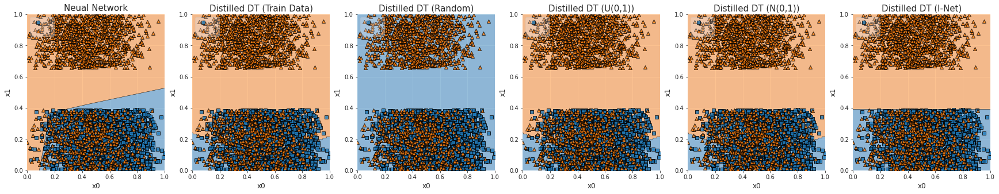

-----------------------------------------------------
Index:  29
Feature 1:  Samples 2558 / 2442
	 Distribution 1: gamma
		 shape: 4.813
		 scale: 1.733
	 Distribution 2: gamma
		 shape: 0.666
		 scale: 4.491
Feature 2:  Samples 1631 / 3369
	 Distribution 1: poisson
		 lam: 3.462
	 Distribution 2: poisson
		 lam: 3.968
Considered Columns:								 0   1
Performance Network:								 0.842
Fidelity DT Sklearn Train Data:							 0.564
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.49
Fidelity DT Sklearn Uniform Data:						 0.566
Fidelity DT Sklearn Normal Data:						 0.564
Fidelity DT I-Net:								 0.928


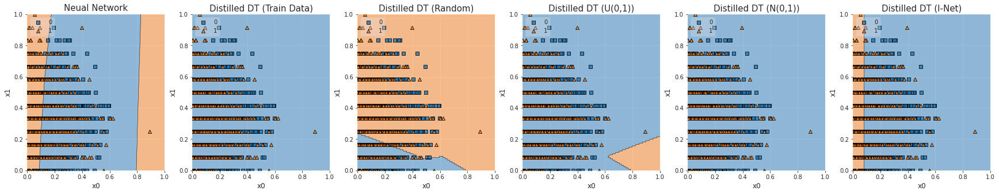

-----------------------------------------------------
Index:  27
Feature 1:  Samples 3769 / 1231
	 Distribution 1: uniform
		 low: 2.806
		 high: 3.645
	 Distribution 2: uniform
		 low: 1.827
		 high: 4.596
Feature 2:  Samples 1361 / 3639
	 Distribution 1: poisson
		 lam: 1.631
	 Distribution 2: poisson
		 lam: 2.769
Considered Columns:								 0   1
Performance Network:								 0.674
Fidelity DT Sklearn Train Data:							 0.722
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.392
Fidelity DT Sklearn Uniform Data:						 0.392
Fidelity DT Sklearn Normal Data:						 0.468
Fidelity DT I-Net:								 0.794


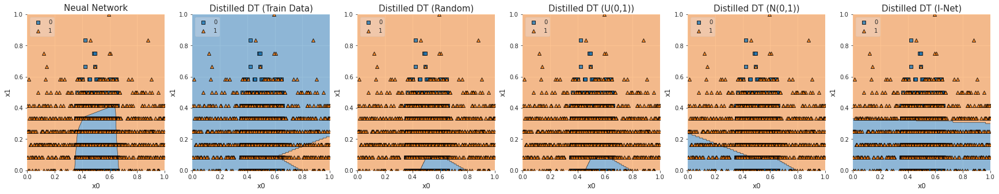

-----------------------------------------------------
Index:  36
Feature 1:  Samples 4742 / 258
	 Distribution 1: gamma
		 shape: 3.1
		 scale: 3.421
	 Distribution 2: gamma
		 shape: 0.612
		 scale: 0.709
Feature 2:  Samples 4926 / 74
	 Distribution 1: poisson
		 lam: 4.35
	 Distribution 2: poisson
		 lam: 2.276
Considered Columns:								 0   1
Performance Network:								 0.528
Fidelity DT Sklearn Train Data:							 0.792
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.214
Fidelity DT Sklearn Uniform Data:						 0.774
Fidelity DT Sklearn Normal Data:						 0.214
Fidelity DT I-Net:								 0.776


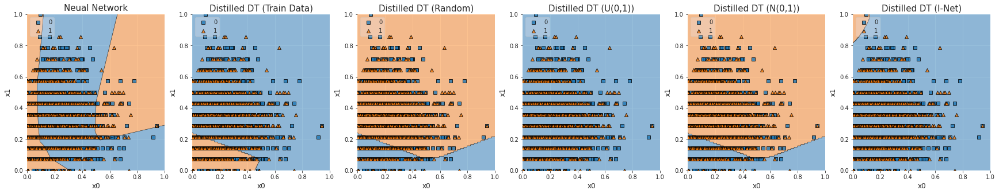

-----------------------------------------------------
Index:  91
Feature 1:  Samples 1711 / 3289
	 Distribution 1: gamma
		 shape: 0.002
		 scale: 4.282
	 Distribution 2: gamma
		 shape: 4.615
		 scale: 2.833
Feature 2:  Samples 4565 / 435
	 Distribution 1: normal
		 loc: 4.862
		 scale: 0.985
	 Distribution 2: normal
		 loc: 2.551
		 scale: 0.699
Considered Columns:								 0   1
Performance Network:								 0.854
Fidelity DT Sklearn Train Data:							 0.62
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.62
Fidelity DT Sklearn Uniform Data:						 0.62
Fidelity DT Sklearn Normal Data:						 0.62
Fidelity DT I-Net:								 0.992


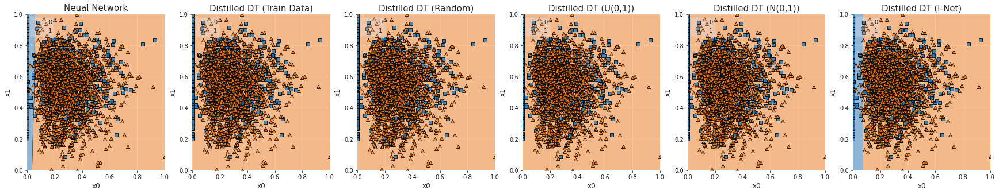

-----------------------------------------------------
Index:  40
Feature 1:  Samples 3399 / 1601
	 Distribution 1: beta
		 a: 3.343
		 b: 4.587
	 Distribution 2: beta
		 a: 4.301
		 b: 1.527
Feature 2:  Samples 2485 / 2515
	 Distribution 1: beta
		 a: 4.163
		 b: 1.019
	 Distribution 2: beta
		 a: 1.445
		 b: 4.762
Considered Columns:								 0   1
Performance Network:								 0.962
Fidelity DT Sklearn Train Data:							 0.68
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.484
Fidelity DT Sklearn Uniform Data:						 0.68
Fidelity DT Sklearn Normal Data:						 0.484
Fidelity DT I-Net:								 0.916


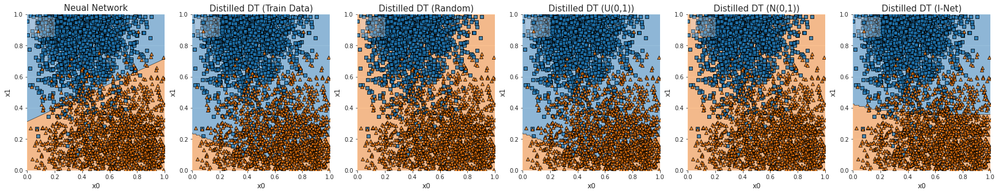

-----------------------------------------------------
Index:  66
Feature 1:  Samples 1045 / 3955
	 Distribution 1: poisson
		 lam: 4.107
	 Distribution 2: poisson
		 lam: 3.45
Feature 2:  Samples 1217 / 3783
	 Distribution 1: beta
		 a: 3.326
		 b: 0.622
	 Distribution 2: beta
		 a: 1.026
		 b: 1.7
Considered Columns:								 0   1
Performance Network:								 0.7
Fidelity DT Sklearn Train Data:							 0.606
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.606
Fidelity DT Sklearn Uniform Data:						 0.576
Fidelity DT Sklearn Normal Data:						 0.606
Fidelity DT I-Net:								 0.962


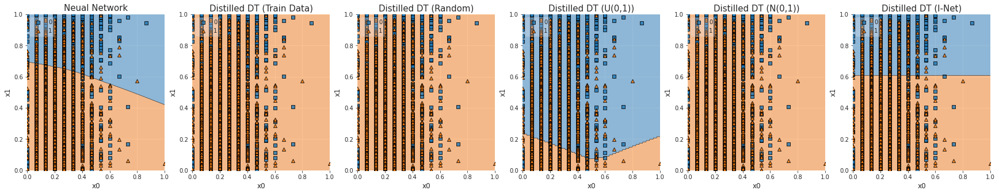

-----------------------------------------------------
Index:  46
Feature 1:  Samples 2491 / 2509
	 Distribution 1: beta
		 a: 2.073
		 b: 3.53
	 Distribution 2: beta
		 a: 1.072
		 b: 4.931
Feature 2:  Samples 3461 / 1539
	 Distribution 1: beta
		 a: 0.564
		 b: 4.871
	 Distribution 2: beta
		 a: 0.388
		 b: 4.2
Considered Columns:								 0   1
Performance Network:								 0.738
Fidelity DT Sklearn Train Data:							 0.672
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.556
Fidelity DT Sklearn Uniform Data:						 0.672
Fidelity DT Sklearn Normal Data:						 0.556
Fidelity DT I-Net:								 0.958


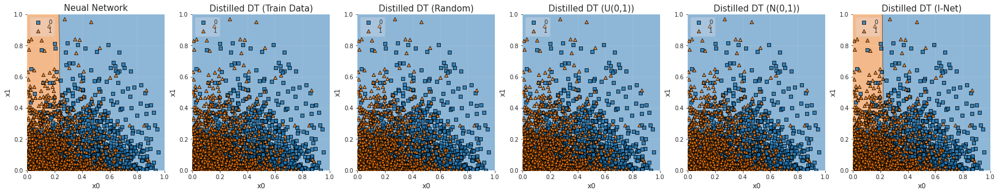

-----------------------------------------------------
Index:  5
Feature 1:  Samples 2916 / 2084
	 Distribution 1: uniform
		 low: 1.66
		 high: 4.464
	 Distribution 2: uniform
		 low: 2.754
		 high: 3.964
Feature 2:  Samples 221 / 4779
	 Distribution 1: normal
		 loc: 1.317
		 scale: 2.669
	 Distribution 2: normal
		 loc: 0.572
		 scale: 4.514
Considered Columns:								 0   1
Performance Network:								 0.714
Fidelity DT Sklearn Train Data:							 0.628
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.376
Fidelity DT Sklearn Uniform Data:						 0.376
Fidelity DT Sklearn Normal Data:						 0.628
Fidelity DT I-Net:								 0.816


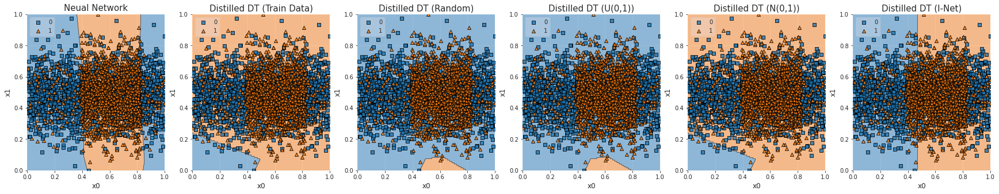

-----------------------------------------------------
Index:  37
Feature 1:  Samples 1936 / 3064
	 Distribution 1: beta
		 a: 1.937
		 b: 1.295
	 Distribution 2: beta
		 a: 3.411
		 b: 4.558
Feature 2:  Samples 4881 / 119
	 Distribution 1: uniform
		 low: 1.554
		 high: 4.095
	 Distribution 2: uniform
		 low: 0.406
		 high: 3.945
Considered Columns:								 0   1
Performance Network:								 0.634
Fidelity DT Sklearn Train Data:							 0.668
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.334
Fidelity DT Sklearn Uniform Data:						 0.668
Fidelity DT Sklearn Normal Data:						 0.668
Fidelity DT I-Net:								 0.908


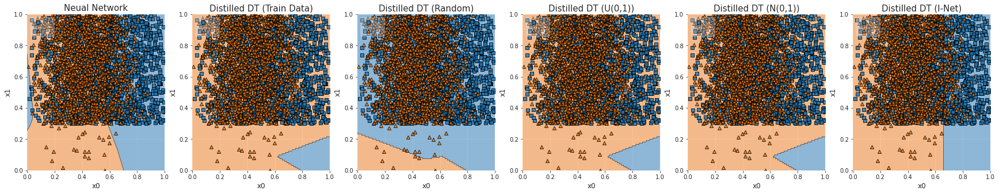

-----------------------------------------------------
Index:  42
Feature 1:  Samples 861 / 4139
	 Distribution 1: gamma
		 shape: 1.636
		 scale: 4.296
	 Distribution 2: gamma
		 shape: 2.517
		 scale: 2.486
Feature 2:  Samples 701 / 4299
	 Distribution 1: gamma
		 shape: 1.137
		 scale: 3.32
	 Distribution 2: gamma
		 shape: 0.478
		 scale: 3.771
Considered Columns:								 0   1
Performance Network:								 0.58
Fidelity DT Sklearn Train Data:							 0.77
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.77
Fidelity DT Sklearn Uniform Data:						 0.398
Fidelity DT Sklearn Normal Data:						 0.398
Fidelity DT I-Net:								 0.866


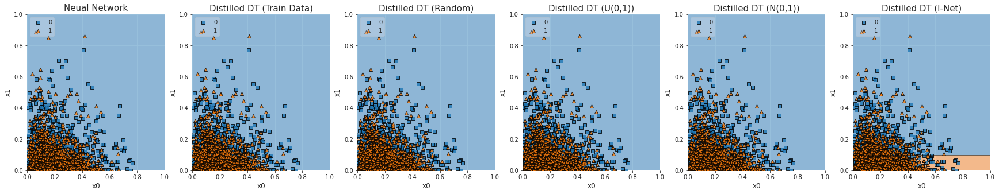

-----------------------------------------------------
Index:  87
Feature 1:  Samples 3559 / 1441
	 Distribution 1: beta
		 a: 1.114
		 b: 0.876
	 Distribution 2: beta
		 a: 4.052
		 b: 4.788
Feature 2:  Samples 225 / 4775
	 Distribution 1: beta
		 a: 3.083
		 b: 1.814
	 Distribution 2: beta
		 a: 4.655
		 b: 3.008
Considered Columns:								 0   1
Performance Network:								 0.598
Fidelity DT Sklearn Train Data:							 0.538
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.464
Fidelity DT Sklearn Uniform Data:						 0.464
Fidelity DT Sklearn Normal Data:						 0.538
Fidelity DT I-Net:								 0.82


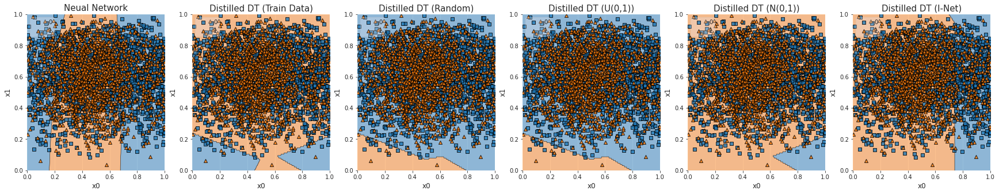

-----------------------------------------------------
Index:  45
Feature 1:  Samples 3617 / 1383
	 Distribution 1: beta
		 a: 2.204
		 b: 4.564
	 Distribution 2: beta
		 a: 4.502
		 b: 1.027
Feature 2:  Samples 2227 / 2773
	 Distribution 1: beta
		 a: 2.434
		 b: 2.206
	 Distribution 2: beta
		 a: 1.241
		 b: 0.953
Considered Columns:								 0   1
Performance Network:								 0.752
Fidelity DT Sklearn Train Data:							 0.732
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.328
Fidelity DT Sklearn Uniform Data:						 0.732
Fidelity DT Sklearn Normal Data:						 0.732
Fidelity DT I-Net:								 0.928


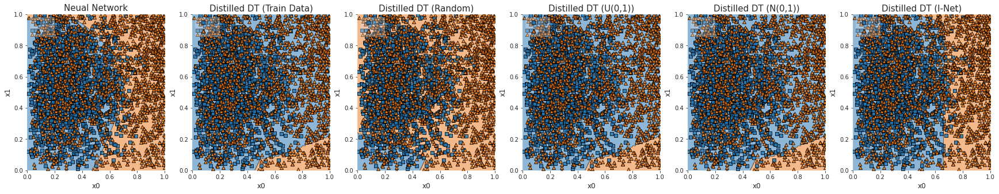

-----------------------------------------------------
Index:  33
Feature 1:  Samples 2440 / 2560
	 Distribution 1: uniform
		 low: 0.193
		 high: 3.901
	 Distribution 2: uniform
		 low: 2.591
		 high: 3.544
Feature 2:  Samples 312 / 4688
	 Distribution 1: beta
		 a: 0.474
		 b: 3.501
	 Distribution 2: beta
		 a: 0.407
		 b: 2.413
Considered Columns:								 0   1
Performance Network:								 0.87
Fidelity DT Sklearn Train Data:							 0.772
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.396
Fidelity DT Sklearn Uniform Data:						 0.62
Fidelity DT Sklearn Normal Data:						 0.62
Fidelity DT I-Net:								 0.874


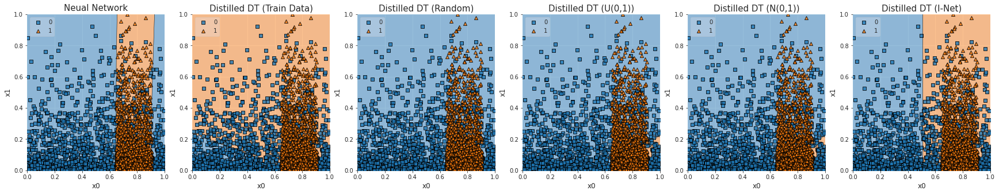

-----------------------------------------------------
Index:  2
Feature 1:  Samples 2576 / 2424
	 Distribution 1: uniform
		 low: 2.754
		 high: 3.541
	 Distribution 2: uniform
		 low: 2.312
		 high: 2.326
Feature 2:  Samples 765 / 4235
	 Distribution 1: poisson
		 lam: 2.191
	 Distribution 2: poisson
		 lam: 0.03
Considered Columns:								 0   1
Performance Network:								 0.986
Fidelity DT Sklearn Train Data:							 0.938
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.54
Fidelity DT Sklearn Uniform Data:						 0.938
Fidelity DT Sklearn Normal Data:						 0.54
Fidelity DT I-Net:								 1.0


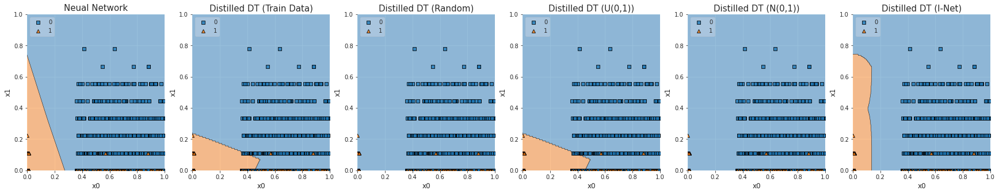

-----------------------------------------------------
Index:  52
Feature 1:  Samples 1693 / 3307
	 Distribution 1: beta
		 a: 1.323
		 b: 2.392
	 Distribution 2: beta
		 a: 0.863
		 b: 4.914
Feature 2:  Samples 3202 / 1798
	 Distribution 1: uniform
		 low: 0.043
		 high: 4.772
	 Distribution 2: uniform
		 low: 3.519
		 high: 4.953
Considered Columns:								 0   1
Performance Network:								 0.768
Fidelity DT Sklearn Train Data:							 0.564
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.55
Fidelity DT Sklearn Uniform Data:						 0.55
Fidelity DT Sklearn Normal Data:						 0.55
Fidelity DT I-Net:								 0.876


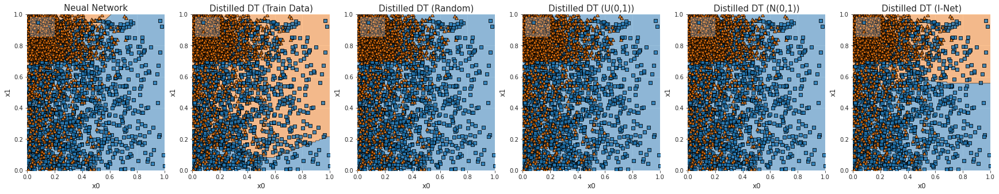

-----------------------------------------------------
Index:  96
Feature 1:  Samples 1447 / 3553
	 Distribution 1: poisson
		 lam: 1.062
	 Distribution 2: poisson
		 lam: 3.485
Feature 2:  Samples 3385 / 1615
	 Distribution 1: beta
		 a: 2.818
		 b: 3.503
	 Distribution 2: beta
		 a: 3.402
		 b: 2.909
Considered Columns:								 0   1
Performance Network:								 0.698
Fidelity DT Sklearn Train Data:							 0.6
Fidelity DT Distilled (['uniform', 'normal', 'gamma', 'beta', 'poisson']):   	 0.6
Fidelity DT Sklearn Uniform Data:						 0.6
Fidelity DT Sklearn Normal Data:						 0.56
Fidelity DT I-Net:								 0.91


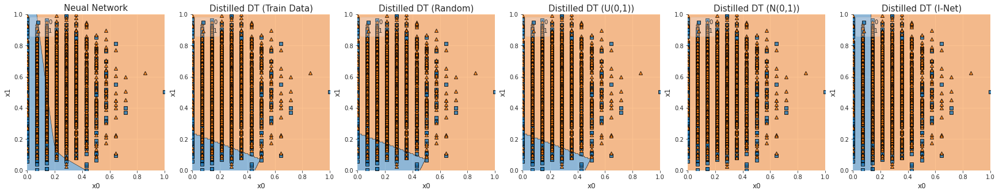

-----------------------------------------------------


In [114]:
if evaluate_distribution:
    timestr = time.strftime("%Y%m%d-%H%M%S")
    identifier_folder = config['function_family']['dt_type'] + '_' + str(config['function_family']['decision_sparsity']) + '_' + timestr
    os.makedirs('./data/distrib_plots/' + identifier_folder + '/', exist_ok=True)
    
    for i in range(min(50, test_size)):
        #index = 14
        #index = np.argmax(np.array(inet_evaluation_result_dict_complete_by_distribution_test['uniform']['inet_scores']['accuracy']) - np.array(inet_evaluation_result_dict_complete_by_distribution_test['uniform']['dt_scores']['accuracy']))
        top_number = i
        #index = np.argsort(np.array(inet_evaluation_result_dict_complete_by_distribution_test['uniform']['inet_scores']['accuracy']) - np.array(inet_evaluation_result_dict_complete_by_distribution_test['uniform']['dt_scores']['accuracy']))[::-1][top_number]

        scores_distilled_median_random = np.median(np.array([inet_evaluation_result_dict_complete_by_distribution_test[str(distrib)]['dt_scores']['accuracy'] for distrib in config['data']['distribution_list_eval']]), axis=0)
        scores_distilled_uniform = inet_evaluation_result_dict_complete_by_distribution_test[str(config['data']['distribution_list_eval'][0])]['dt_scores']['accuracy_uniform_data']
        scores_distilled_normal = inet_evaluation_result_dict_complete_by_distribution_test[str(config['data']['distribution_list_eval'][0])]['dt_scores']['accuracy_normal_data']
        
        scores_distilled_array = np.mean([scores_distilled_median_random, scores_distilled_uniform, scores_distilled_normal], axis=0)
        
        index = np.argsort(np.array(inet_evaluation_result_dict_complete_by_distribution_test[list(inet_evaluation_result_dict_complete_by_distribution_test.keys())[0]]['inet_scores']['accuracy']) - scores_distilled_array)[::-1][top_number]
        #index = np.argsort(np.array(inet_evaluation_result_dict_complete_by_distribution_test['uniform']['inet_scores']['accuracy']) - np.max(np.array([inet_evaluation_result_dict_complete_by_distribution_test[distrib]['dt_scores']['accuracy'] for distrib in config['data']['distribution_list_eval']]), axis=0))[::-1][top_number]
        #index = np.argsort(np.array(inet_evaluation_result_dict_complete_by_distribution_test['uniform']['inet_scores']['accuracy']) - np.mean(np.array([inet_evaluation_result_dict_complete_by_distribution_test[distrib]['dt_scores']['accuracy'] for distrib in config['data']['distribution_list_eval']]), axis=0))[::-1][top_number]

        distrib_for_index = np.argmax(np.array([inet_evaluation_result_dict_complete_by_distribution_test[str(distrib)]['dt_scores']['accuracy'] for distrib in config['data']['distribution_list_eval']])[:,index])

        print('Index: ', index)
        distribution_dict = distribution_parameter_list_list[index]

        print('Feature 1: ', 'Samples', distribution_dict[0][list(distribution_dict[0].keys())[0]]['samples_class_0'], '/', config['data']['lambda_dataset_size']-distribution_dict[0][list(distribution_dict[0].keys())[0]]['samples_class_0'])
        print('\t Distribution 1: ' + list(distribution_dict[0].keys())[0])
        for j, (distrib_parameter_name, distrib_parameter_value) in enumerate(distribution_dict[0][list(distribution_dict[0].keys())[0]]['class_0'].items()):
            print('\t\t '  + distrib_parameter_name +  ': ' + str(np.round(distrib_parameter_value, 3)))
        print('\t Distribution 2: ' + list(distribution_dict[0].keys())[0])
        for j, (distrib_parameter_name, distrib_parameter_value) in enumerate(distribution_dict[0][list(distribution_dict[0].keys())[0]]['class_1'].items()):
            print('\t\t '  + distrib_parameter_name +  ': ' + str(np.round(distrib_parameter_value, 3)))

        print('Feature 2: ', 'Samples', distribution_dict[1][list(distribution_dict[1].keys())[0]]['samples_class_0'], '/', config['data']['lambda_dataset_size']-distribution_dict[1][list(distribution_dict[1].keys())[0]]['samples_class_0'])
        print('\t Distribution 1: ' + list(distribution_dict[1].keys())[0])
        for j, (distrib_parameter_name, distrib_parameter_value) in enumerate(distribution_dict[1][list(distribution_dict[1].keys())[0]]['class_0'].items()):
            print('\t\t '  + distrib_parameter_name +  ': ' + str(np.round(distrib_parameter_value, 3)))
        print('\t Distribution 2: ' + list(distribution_dict[1].keys())[0])
        for j, (distrib_parameter_name, distrib_parameter_value) in enumerate(distribution_dict[1][list(distribution_dict[1].keys())[0]]['class_1'].items()):
            print('\t\t '  + distrib_parameter_name +  ': ' + str(np.round(distrib_parameter_value, 3)))

        identifier_file = 'index' + str(index) + '_' + '_'.join([list(dist.keys())[0] + '_' +  '_'.join([key + '-' + str(np.round(value, 4)) for key, value in dist[list(dist.keys())[0]]['class_0'].items()]) + '_' + '_'.join([key + '-' + str(np.round(value, 4)) for key, value in dist[list(dist.keys())[0]]['class_1'].items()]) for dist in distribution_parameter_list_list[index]])
        
        plot_decision_area_evaluation_all_distrib(data_dict_list_test[index]['X_train'], 
                                            data_dict_list_test[index]['y_train'], 
                                            data_dict_list_test[index]['X_test'], 
                                            data_dict_list_test[index]['y_test'],
                                            None,
                                            None,
                                            network_parameters_to_network(shaped_network_parameters_to_array(test_network_list_distrib[index], config), config),
                                            dt_distilled_list_test[0][index][-3],
                                            dt_distilled_list_test[0][index][-2],
                                            dt_distilled_list_test[0][index][-1],
                                            [dt_distilled_list_test[i][index][0] for i in range(len(config['data']['distribution_list_eval']))],     
                                            dt_inet_list_test[0][index],
                                            np.array([str(i) for i in range(data_dict_list_test[index]['X_train'].shape[1])]),
                                            config['data']['distribution_list_eval'],
                                            config,
                                            identifier_folder = identifier_folder,
                                            identifier_file = identifier_file
                                           )    



I-Net Decision Tree


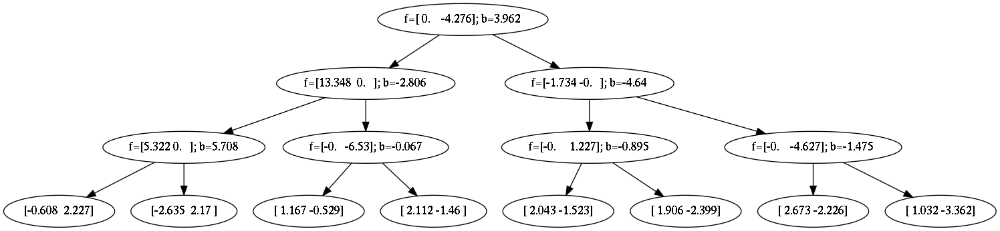

Random Data Decision Tree


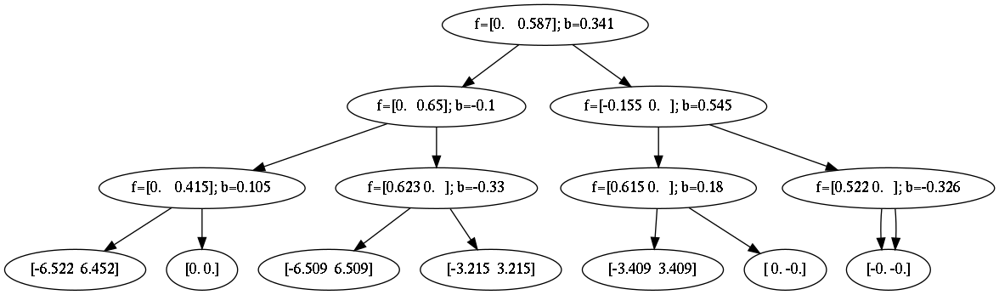

Train Data Decision Tree


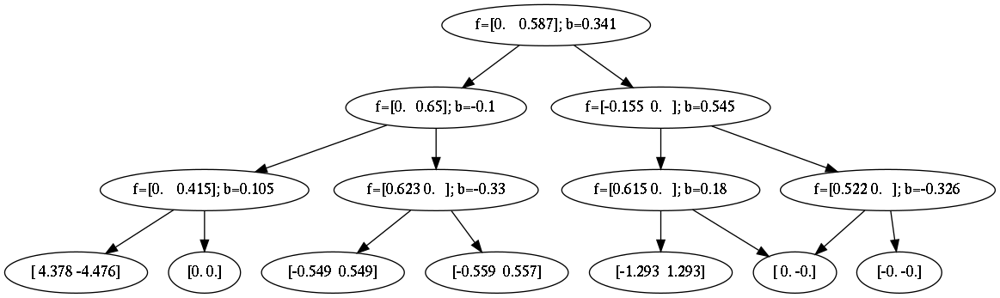

Uniform Data Decision Tree


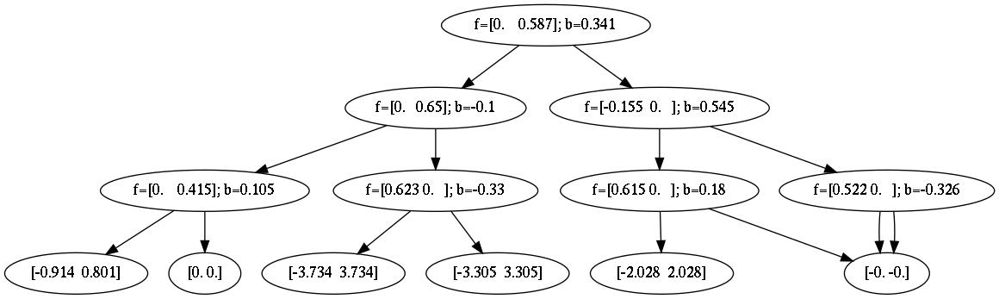

<Figure size 1080x576 with 0 Axes>

<Figure size 1080x576 with 0 Axes>

<Figure size 1080x576 with 0 Axes>

<Figure size 1080x576 with 0 Axes>

In [33]:
if config['function_family']['dt_type'] == 'vanilla':
    print('I-Net Decision Tree')
    plt.figure(figsize=(15,8))
    dt_inet = parameterDT(dt_inet_list_test[distrib_for_index][index], config)
    image = dt_inet.plot()
    display(image)
    
    print('Random Data Decision Tree')
    plt.figure(figsize=(15,8))
    plot_tree(dt_distilled_list_test[distrib_for_index][index][0], fontsize=10)  #fist index=distrib; second index=index; third index=[10000, 'TRAINDATA', 'STANDARDUNIFORM', 'STANDARDNORMAL']
    plt.show()
    
    print('Train Data Decision Tree')
    plt.figure(figsize=(15,8))
    plot_tree(dt_distilled_list_test[distrib_for_index][index][1], fontsize=10)  #fist index=distrib; second index=index; third index=[10000, 'TRAINDATA', 'STANDARDUNIFORM', 'STANDARDNORMAL']
    plt.show()    
    
    print('Uniform Data Decision Tree')
    plt.figure(figsize=(15,8))
    plot_tree(dt_distilled_list_test[distrib_for_index][index][2], fontsize=10)  #fist index=distrib; second index=index; third index=[10000, 'TRAINDATA', 'STANDARDUNIFORM', 'STANDARDNORMAL']
    plt.show()    
else:
    print('I-Net Decision Tree')
    plt.figure(figsize=(15,8))
    dt_parameters = dt_inet_list_test[distrib_for_index][index]
    tree = generate_random_decision_tree(config)
    tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
    image = tree.plot_tree()
    display(image)
    
    print('Random Data Decision Tree')
    plt.figure(figsize=(15,8))
    image = dt_distilled_list_test[distrib_for_index][index][0].plot_tree() #fist index=distrib; second index=index; third index=[10000, 'TRAINDATA', 'STANDARDUNIFORM', 'STANDARDNORMAL']
    display(image)
    
    print('Train Data Decision Tree')
    plt.figure(figsize=(15,8)) 
    image = dt_distilled_list_test[distrib_for_index][index][1].plot_tree() #fist index=distrib; second index=index; third index=[10000, 'TRAINDATA', 'STANDARDUNIFORM', 'STANDARDNORMAL'] 
    display(image)
    
    print('Uniform Data Decision Tree')
    plt.figure(figsize=(15,8))
    image = dt_distilled_list_test[distrib_for_index][index][2].plot_tree() #fist index=distrib; second index=index; third index=[10000, 'TRAINDATA', 'STANDARDUNIFORM', 'STANDARDNORMAL']
    display(image)

In [34]:
if False:
    plot_class_distrib_by_feature(model = model,
                                  index = index,
                                  test_network = network_parameters_to_network(lambda_net_dataset_valid.network_parameters_array[index], config, base_model=None),
                                  distribution_training = config['data']['distribution_list_eval'][distrib_for_index],
                                  distribution_dict = lambda_net_dataset_valid.distribution_dict_list_list[index],
                                  X_test = lambda_net_dataset_valid.X_test_lambda_array[index],
                                  config = config)

In [35]:
if False:
    plot_class_distrib_by_feature(model = model,
                                  index = index,
                                  test_network = network_parameters_to_network(shaped_network_parameters_to_array(test_network_list_distrib[index], config), config, base_model=None),
                                  distribution_training = config['data']['distribution_list_eval'][distrib_for_index],
                                  distribution_dict = lambda_net_dataset_valid.distribution_dict_list_list[index],
                                  X_test =  data_dict_list_test[0]['X_test'],
                                  config = config)

### Distribution Evaluation (Selected Samples)

In [36]:
#%load_ext autoreload
#%autoreload 2
if False:
    evaluate_network_on_distribution_custom_parameters(distribution_name_feature_0 = 'normal',
                                                       distribution_name_feature_1 = 'normal',
                                                       distribution_parameters_0_param_1_feature_0 = 1.188840288782265,
                                                       distribution_parameters_0_param_2_feature_0 = 0.8566173698593895,
                                                       distribution_parameters_1_param_1_feature_0 = 0.8713650102755661,
                                                       distribution_parameters_1_param_2_feature_0 = 1.8484540179178748,
                                                       distribution_parameters_0_param_1_feature_1 = 1.7185974826882278,
                                                       distribution_parameters_0_param_2_feature_1 = 0.5807878500034862,
                                                       distribution_parameters_1_param_1_feature_1 = 0.44369536008631294,
                                                       distribution_parameters_1_param_2_feature_1 = 1.17864258666672,
                                                       inet = model,
                                                       config = config,
                                                       distribution_list_evaluation = config['data']['distribution_list_eval'])


# Real-World Data Evaluation

In [37]:
#dataset_size_list = flatten_list([[10_000]*config['evaluation']['number_of_random_evaluations_per_distribution'], 'TRAINDATA', 'STANDARDUNIFORM', 'STANDARDNORMAL'])#[1_000, 10_000, 100_000, 1_000_000, 'TRAINDATA']
dataset_size_list = flatten_list([[10_000]*config['evaluation']['number_of_random_evaluations_per_distribution'], 
                                  'TRAINDATA', 
                                  ['STANDARDUNIFORM']*config['evaluation']['number_of_random_evaluations_per_distribution'], 
                                  ['STANDARDNORMAL']*config['evaluation']['number_of_random_evaluations_per_distribution']])#[1_000, 10_000, 100_000, 1_000_000, 'TRAINDATA']


dataset_size_list_print = []
for size in dataset_size_list:
    if type(size) is int:
        size = size//1000
        size = str(size) + 'k'
        dataset_size_list_print.append(size)
    else:
        dataset_size_list_print.append(size)

In [38]:
#distances_dict = {}
evaluation_result_dict = {}
results_dict = {}
dt_inet_dict = {}
dt_distilled_list_dict = {}
data_dict = {}
normalizer_list_dict = {}
test_network_list = {}

identifier_list = []


## Adult Dataset

In [39]:
feature_names = [
                 "Age", #0
                 "Workclass",  #1
                 "fnlwgt",  #2
                 "Education",  #3
                 "Education-Num",  #4
                 "Marital Status", #5
                 "Occupation",  #6
                 "Relationship",  #7
                 "Race",  #8
                 "Sex",  #9
                 "Capital Gain",  #10
                 "Capital Loss", #11
                 "Hours per week",  #12
                 "Country", #13
                 "capital_gain" #14
                ] 

adult_data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data', names=feature_names, index_col=False)


#adult_data['Workclass'][adult_data['Workclass'] != ' Private'] = 'Other'
#adult_data['Race'][adult_data['Race'] != ' White'] = 'Other'

#adult_data.head()

features_select = [
                 "Sex",  #9 
                 "Race",  #8
                 "Workclass",  #1
                 "Age", #0
                 "fnlwgt",  #2
                 #"Education",  #3
                 "Education-Num",  #4
                 "Marital Status", #5
                 #"Occupation",  #6
                 #"Relationship",  #7
                 "Capital Gain",  #10
                 "Capital Loss", #11
                 "Hours per week",  #12
                 #"Country", #13 
                 "capital_gain"
                  ]

adult_data = adult_data[features_select]

nominal_features_adult = [
                          'Race', 
                          'Workclass', 
                          #'Education',
                          "Marital Status",
                          #"Occupation", 
                          #"Relationship"
                        ]
ordinal_features_adult = ['Sex']

X_data_adult = adult_data.drop(['capital_gain'], axis = 1)

#y_data_adult = pd.Series(OrdinalEncoder().fit_transform(adult_data['capital_gain'].values.reshape(-1, 1)).flatten(), name='capital_gain')
y_data_adult = ((adult_data['capital_gain'] != ' <=50K') * 1)

In [40]:
config_train_network_adult = deepcopy(config)
#config_train_network_adult['lambda_net']['batch_lambda'] = 32
#config_train_network_adult['lambda_net']['learning_rate_lambda'] = 0.0003
#config_train_network_adult['lambda_net']['dropout_lambda'] = 0.25
#config_train_network_adult['lambda_net']['epochs_lambda'] = 5

In [41]:
identifier = 'Adult'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_adult, 
                                                                y_data_adult, 
                                                                nominal_features = nominal_features_adult, 
                                                                ordinal_features = ordinal_features_adult,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = config_train_network_adult)

print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict['Adult'], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (32561, 10)
Original Data Shape (encoded):  (32561, 28)
Original Data Class Distribution:  7841  (true) / 24720  (false)


In [42]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [43]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Titanic Dataset

In [44]:
titanic_data = pd.read_csv("./real_world_datasets/Titanic/train.csv")

titanic_data['Age'].fillna(titanic_data['Age'].mean(), inplace = True)
titanic_data['Fare'].fillna(titanic_data['Fare'].mean(), inplace = True)
    
titanic_data['Embarked'].fillna('S', inplace = True)

features_select = [
                    #'Cabin', 
                    #'Ticket', 
                    #'Name', 
                    #'PassengerId'    
                    'Sex',    
                    'Embarked',
                    'Pclass',
                    'Age',
                    'SibSp',    
                    'Parch',
                    'Fare',    
                    'Survived',    
                  ]

titanic_data = titanic_data[features_select]

nominal_features_titanic = ['Embarked']#[1, 2, 7]
ordinal_features_titanic = ['Sex']
    
X_data_titanic = titanic_data.drop(['Survived'], axis = 1)
y_data_titanic = titanic_data['Survived']


    survival	Survival	0 = No, 1 = Yes
    pclass	Ticket class	1 = 1st, 2 = 2nd, 3 = 3rd
    sex	Sex	
    Age	Age in years	
    sibsp	# of siblings / spouses aboard the Titanic	
    parch	# of parents / children aboard the Titanic	
    ticket	Ticket number	
    fare	Passenger fare	
    cabin	Cabin number	
    embarked	Port of Embarkation	C = Cherbourg, Q = Queenstown, S = Southampton

In [45]:
identifier = 'Titanic'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_titanic, 
                                                                y_data_titanic, 
                                                                nominal_features = nominal_features_titanic, 
                                                                ordinal_features = ordinal_features_titanic,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (891, 7)
Original Data Shape (encoded):  (891, 9)
Original Data Class Distribution:  342  (true) / 549  (false)


In [46]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [47]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     
    
    y_train = data_dict[identifier]['y_train']
    y_train_pred = pd.Series(np.round(test_network_list[identifier].predict(data_dict[identifier]['X_train'])).ravel(), 
                             name="Survived")
    X_data = pd.concat([data_dict[identifier]['X_train'], y_train_pred], axis=1)
    display(X_data.head())
    
    X_data.groupby("Survived").SibSp.hist(alpha=0.6)
    plt.show()
    #X_data[X_data.Parch > 0.8].groupby("Survived").Age.hist(alpha=0.6)
    #plt.show()
    X_data.groupby("Survived").Age.hist(alpha=0.6)
    plt.show()
    X_data.groupby("Survived").Sex.hist(alpha=0.6)
    plt.show()
    
    
    uniform_data = generate_random_data_points_custom(config['data']['x_min'], 
                                   config['data']['x_max'],
                                   10_000, 
                                   config['data']['number_of_variables'], 
                                   config['data']['categorical_indices'],
                                   distrib='standarduniform',
                                   random_parameters=config['data']['random_parameters_distribution'],
                                   distrib_param_max=config['data']['distrib_param_max'],
                                   seed=config['computation']['RANDOM_SEED'],
                                   config=config)    
    
    y_uniform_data = np.round(test_network_list[identifier].predict(uniform_data))

    uniform_data_with_labels_df = pd.DataFrame(data=np.hstack([uniform_data, y_uniform_data]), columns=X_data.columns)    
    
    uniform_data_with_labels_df.groupby("Survived").SibSp.hist(alpha=0.6)
    plt.show()
    uniform_data_with_labels_df[uniform_data_with_labels_df.SibSp > 0.56].groupby("Survived").Age.hist(alpha=0.6)
    plt.show()
    uniform_data_with_labels_df[uniform_data_with_labels_df.SibSp < 0.56].groupby("Survived").Age.hist(alpha=0.6)
    plt.show()    
    
    uniform_data_with_labels_df.groupby("Survived").Age.hist(alpha=0.6)
    plt.show()
    uniform_data_with_labels_df.groupby("Survived").Sex.hist(alpha=0.6)
    plt.show()        
    
            

## Absenteeism at Work Dataset

In [48]:
absenteeism_data = pd.read_csv('real_world_datasets/Absenteeism/absenteeism.csv', delimiter=';')

features_select = [
                           'Disciplinary failure', #CATEGORICAL
                           'Social drinker', #CATEGORICAL
                           'Social smoker', #CATEGORICAL
                           'Transportation expense', 
                           'Distance from Residence to Work',
                           'Service time', 
                           'Age', 
                           'Work load Average/day ', 
                           'Hit target',
                           'Education', 
                           'Son', 
                           'Pet', 
                           'Weight', 
                           'Height', 
                           'Body mass index', 
                           'Absenteeism time in hours'
                        ]

absenteeism_data = absenteeism_data[features_select]

nominal_features_absenteeism = []
ordinal_features_absenteeism = []
    
X_data_absenteeism = absenteeism_data.drop(['Absenteeism time in hours'], axis = 1)
y_data_absenteeism = ((absenteeism_data['Absenteeism time in hours'] > 4) * 1) #absenteeism_data['Absenteeism time in hours']


    3. Month of absence
    4. Day of the week (Monday (2), Tuesday (3), Wednesday (4), Thursday (5), Friday (6))
    5. Seasons (summer (1), autumn (2), winter (3), spring (4))
    6. Transportation expense
    7. Distance from Residence to Work (kilometers)
    8. Service time
    9. Age
    10. Work load Average/day
    11. Hit target
    12. Disciplinary failure (yes=1; no=0)
    13. Education (high school (1), graduate (2), postgraduate (3), master and doctor (4))
    14. Son (number of children)
    15. Social drinker (yes=1; no=0)
    16. Social smoker (yes=1; no=0)
    17. Pet (number of pet)
    18. Weight
    19. Height
    20. Body mass index
    21. Absenteeism time in hours (target)

In [49]:
identifier = 'Absenteeism'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_absenteeism, 
                                                                y_data_absenteeism, 
                                                                nominal_features = nominal_features_absenteeism, 
                                                                ordinal_features = ordinal_features_absenteeism,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)

print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (740, 15)
Original Data Shape (encoded):  (740, 15)
Original Data Class Distribution:  279  (true) / 461  (false)


In [50]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [51]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Loan House

In [52]:
loan_data = pd.read_csv('real_world_datasets/Loan/loan-train.csv', delimiter=',')

loan_data['Gender'].fillna(loan_data['Gender'].mode()[0], inplace=True)
loan_data['Dependents'].fillna(loan_data['Dependents'].mode()[0], inplace=True)
loan_data['Married'].fillna(loan_data['Married'].mode()[0], inplace=True)
loan_data['Self_Employed'].fillna(loan_data['Self_Employed'].mode()[0], inplace=True)
loan_data['LoanAmount'].fillna(loan_data['LoanAmount'].mean(), inplace=True)
loan_data['Loan_Amount_Term'].fillna(loan_data['Loan_Amount_Term'].mean(), inplace=True)
loan_data['Credit_History'].fillna(loan_data['Credit_History'].mean(), inplace=True)

features_select = [
                    #'Loan_ID', 
                    'Gender', #
                    'Married', 
                    'Dependents', 
                    'Education',
                    'Self_Employed', 
                    'ApplicantIncome', 
                    'CoapplicantIncome', 
                    'LoanAmount',
                    'Loan_Amount_Term', 
                    'Credit_History', 
                    'Property_Area', 
                    'Loan_Status'
                    ]

loan_data = loan_data[features_select]

#loan_data['Dependents'][loan_data['Dependents'] == '3+'] = 4
#loan_data['Dependents'] = loan_data['Dependents'].astype(int)

#loan_data['Property_Area'][loan_data['Property_Area'] == 'Rural'] = 0
#loan_data['Property_Area'][loan_data['Property_Area'] == 'Semiurban'] = 1
#loan_data['Property_Area'][loan_data['Property_Area'] == 'Urban'] = 2
#loan_data['Property_Area'] = loan_data['Property_Area'].astype(int)

nominal_features_loan = [
                        'Dependents',
                        'Property_Area',    
                        ]


ordinal_features_loan = [
                    'Education',
                    'Gender', 
                    'Married', 
                    'Self_Employed',
                   ]
    
X_data_loan = loan_data.drop(['Loan_Status'], axis = 1)
y_data_loan = ((loan_data['Loan_Status'] == 'Y') * 1) 

In [53]:
config_train_network_loan_house = deepcopy(config)
#config_train_network_loan_house['lambda_net']['batch_lambda'] = 64#16
#config_train_network_loan_house['lambda_net']['learning_rate_lambda'] = 0.001
#config_train_network_loan_house['lambda_net']['dropout_lambda'] = 0#.1
#config_train_network_loan_house['lambda_net']['epochs_lambda'] = 500
#config_train_network_loan_house['lambda_net']['optimizer_lambda'] = 'adam'


In [54]:
identifier = 'Loan House'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_loan, 
                                                                y_data_loan, 
                                                                nominal_features = nominal_features_loan, 
                                                                ordinal_features = ordinal_features_loan,
                                                                #config = config_train_network_loan_house,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (614, 11)
Original Data Shape (encoded):  (614, 16)
Original Data Class Distribution:  422  (true) / 192  (false)


In [55]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [56]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Loan Credit

In [57]:
loan_credit_data = pd.read_csv('real_world_datasets/Credit Loan/train_split.csv', delimiter=',')

loan_credit_data['emp_title'].fillna(loan_credit_data['emp_title'].mode()[0], inplace=True)
loan_credit_data['emp_length'].fillna(loan_credit_data['emp_length'].mode()[0], inplace=True)
#loan_credit_data['desc'].fillna(loan_credit_data['desc'].mode()[0], inplace=True)
loan_credit_data['title'].fillna(loan_credit_data['title'].mode()[0], inplace=True)
#loan_credit_data['mths_since_last_delinq'].fillna(loan_credit_data['mths_since_last_delinq'].mode()[0], inplace=True)
#loan_credit_data['mths_since_last_record'].fillna(loan_credit_data['mths_since_last_record'].mode()[0], inplace=True)
loan_credit_data['revol_util'].fillna(loan_credit_data['revol_util'].mode()[0], inplace=True)
loan_credit_data['collections_12_mths_ex_med'].fillna(loan_credit_data['collections_12_mths_ex_med'].mode()[0], inplace=True)
#loan_credit_data['mths_since_last_major_derog'].fillna(loan_credit_data['mths_since_last_major_derog'].mode()[0], inplace=True)
#loan_credit_data['verification_status_joint'].fillna(loan_credit_data['verification_status_joint'].mode()[0], inplace=True)
loan_credit_data['tot_coll_amt'].fillna(loan_credit_data['tot_coll_amt'].mode()[0], inplace=True)
loan_credit_data['tot_cur_bal'].fillna(loan_credit_data['tot_cur_bal'].mode()[0], inplace=True)
loan_credit_data['total_rev_hi_lim'].fillna(loan_credit_data['total_rev_hi_lim'].mode()[0], inplace=True)


##remove too many null
#'mths_since_last_delinq','mths_since_last_record', 'mths_since_last_major_derog','pymnt_plan','desc', 'verification_status_joint'


features_select = [
                    #'member_id', 
                    'loan_amnt', 
                    'funded_amnt', 
                    'funded_amnt_inv', 
                    'term',
                    #'batch_enrolled',
                    'int_rate', 
                    'grade', 
                    #'sub_grade', 
                    #'emp_title',
                    'emp_length',
                    'home_ownership', 
                    'annual_inc', 
                    'verification_status',
                    #'pymnt_plan', 
                    #'desc', 
                    'purpose', 
                    'title', 
                    #'zip_code', 
                    #'addr_state',
                    'dti', 
                    'delinq_2yrs', 
                    'inq_last_6mths', 
                    #'mths_since_last_delinq',
                    #'mths_since_last_record',
                    'open_acc', 
                    'pub_rec', 
                    'revol_bal',
                    'revol_util', 
                    'total_acc', 
                    'initial_list_status', 
                    'total_rec_int',
                    'total_rec_late_fee', 
                    'recoveries', 
                    'collection_recovery_fee',
                    'collections_12_mths_ex_med', 
                    #'mths_since_last_major_derog',
                    'application_type', 
                    #'verification_status_joint', 
                    'last_week_pay',
                    'acc_now_delinq', 
                    'tot_coll_amt', 
                    'tot_cur_bal', 
                    'total_rev_hi_lim',
                    'loan_status'
                    ]

loan_credit_data = loan_credit_data[features_select]

nominal_features_loan_credit = [

                        ]
ordinal_features_loan_credit = [
                    #'member_id', 
                    'loan_amnt', 
                    'funded_amnt', 
                    'funded_amnt_inv', 
                    'term',
                    #'batch_enrolled',
                    'int_rate', 
                    'grade', 
                    #'sub_grade', 
                    #'emp_title',
                    'emp_length',
                    'home_ownership', 
                    'annual_inc', 
                    'verification_status',
                    #'pymnt_plan', 
                    #'desc', 
                    'purpose', 
                    'title', 
                    #'zip_code', 
                    #'addr_state',
                    'dti', 
                    'delinq_2yrs', 
                    'inq_last_6mths', 
                    #'mths_since_last_delinq',
                    #'mths_since_last_record',
                    'open_acc', 
                    'pub_rec', 
                    'revol_bal',
                    'revol_util', 
                    'total_acc', 
                    'initial_list_status', 
                    'total_rec_int',
                    'total_rec_late_fee', 
                    'recoveries', 
                    'collection_recovery_fee',
                    'collections_12_mths_ex_med', 
                    #'mths_since_last_major_derog',
                    'application_type', 
                    #'verification_status_joint', 
                    'last_week_pay',
                    'acc_now_delinq', 
                    'tot_coll_amt', 
                    'tot_cur_bal', 
                    'total_rev_hi_lim',
                   ]
    
X_data_loan_credit = loan_credit_data.drop(['loan_status'], axis = 1)
y_data_loan_credit = pd.Series(OrdinalEncoder().fit_transform(loan_credit_data['loan_status'].values.reshape(-1, 1)).flatten(), name='loan_status')


In [58]:
identifier = 'Loan Credit'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_loan_credit, 
                                                                y_data_loan_credit, 
                                                                nominal_features = nominal_features_loan_credit, 
                                                                ordinal_features = ordinal_features_loan_credit,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (63999, 32)
Original Data Shape (encoded):  (63999, 32)
Original Data Class Distribution:  15197  (true) / 48802  (false)


In [59]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [60]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Medical Insurance

In [61]:
medical_insurance_data = pd.read_csv('real_world_datasets/Medical Insurance/insurance.csv', delimiter=',')

features_select = [
                    'age', 
                    'sex', 
                    'bmi', 
                    'children', 
                    'smoker',
                    'region',
                    'charges'
                    ]

medical_insurance_data = medical_insurance_data[features_select]

nominal_features_medical_insurance = [
                    'region',
                        ]
ordinal_features_medical_insurance = [
                    'sex',
                    'smoker'
                   ]

    
X_data_medical_insurance = medical_insurance_data.drop(['charges'], axis = 1)
y_data_medical_insurance = ((medical_insurance_data['charges'] > 10_000) * 1)

X_data_medical_insurance.head()


,age,sex,bmi,children,smoker,region
0,19,female,27.900,0,yes,southwest
1,18,male,33.770,1,no,southeast
2,28,male,33.000,3,no,southeast
3,33,male,22.705,0,no,northwest
4,32,male,28.880,0,no,northwest


In [62]:
identifier = 'Medical Insurance'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_medical_insurance, 
                                                                y_data_medical_insurance, 
                                                                nominal_features = nominal_features_medical_insurance, 
                                                                ordinal_features = ordinal_features_medical_insurance,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (1338, 6)
Original Data Shape (encoded):  (1338, 9)
Original Data Class Distribution:  626  (true) / 712  (false)


In [63]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [64]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Bank Marketing

In [65]:
bank_data = pd.read_csv('real_world_datasets/Bank Marketing/bank-full.csv', delimiter=';') #bank

features_select = [
                    'age',
                    'job', 
                    'marital', 
                    'education', 
                    'default',
                    'housing',
                    'loan',
                    #'contact',
                    #'day',
                    #'month',
                    'duration',
                    'campaign',
                    'pdays',
                    'previous',
                    'poutcome',
                    'y',
                    ]

bank_data = bank_data[features_select]

nominal_features_bank = [
                        'job',
                        'education',
                        #'contact',
                        #'day',
                        #'month',
                        'poutcome',
                        ]
ordinal_features_bank = [
                    'marital',
                    'default',
                    'housing',
                    'loan',
                   ]

    
X_data_bank = bank_data.drop(['y'], axis = 1)
y_data_bank = pd.Series(OrdinalEncoder().fit_transform(bank_data['y'].values.reshape(-1, 1)).flatten(), name='y')


In [66]:
identifier = 'Bank Marketing'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_bank, 
                                                                y_data_bank, 
                                                                nominal_features = nominal_features_bank, 
                                                                ordinal_features = ordinal_features_bank,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (45211, 12)
Original Data Shape (encoded):  (45211, 29)
Original Data Class Distribution:  5289  (true) / 39922  (false)


In [67]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [68]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Cervical cancer (Risk Factors) Data Set

In [69]:
cc_data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/00383/risk_factors_cervical_cancer.csv', index_col=False)#, names=feature_names

features_select = [
                    'Age',
                    'Number of sexual partners',
                    'First sexual intercourse',
                    'Num of pregnancies',
                    'Smokes',
                    'Smokes (years)',
                    'Hormonal Contraceptives',
                    'Hormonal Contraceptives (years)',
                    'IUD',
                    'IUD (years)',
                    'STDs',
                    'STDs (number)',
                    'STDs: Number of diagnosis',
                    'STDs: Time since first diagnosis',
                    'STDs: Time since last diagnosis',
                    'Biopsy'
                    ]

cc_data = cc_data[features_select]

cc_data['Number of sexual partners'][cc_data['Number of sexual partners'] == '?'] = cc_data['Number of sexual partners'].mode()[0]
cc_data['First sexual intercourse'][cc_data['First sexual intercourse'] == '?'] = cc_data['First sexual intercourse'].mode()[0]
cc_data['Num of pregnancies'][cc_data['Num of pregnancies'] == '?'] = cc_data['Num of pregnancies'].mode()[0]
cc_data['Smokes'][cc_data['Smokes'] == '?'] = cc_data['Smokes'].mode()[0]
cc_data['Smokes (years)'][cc_data['Smokes (years)'] == '?'] = cc_data['Smokes (years)'].mode()[0]
cc_data['Hormonal Contraceptives'][cc_data['Hormonal Contraceptives'] == '?'] = cc_data['Hormonal Contraceptives'].mode()[0]
cc_data['Hormonal Contraceptives (years)'][cc_data['Hormonal Contraceptives (years)'] == '?'] = cc_data['Hormonal Contraceptives (years)'].mode()[0]
cc_data['IUD'][cc_data['IUD'] == '?'] = cc_data['IUD'].mode()[0]
cc_data['IUD (years)'][cc_data['IUD (years)'] == '?'] = cc_data['IUD (years)'].mode()[0]
cc_data['STDs'][cc_data['STDs'] == '?'] = cc_data['STDs'].mode()[0]
cc_data['STDs (number)'][cc_data['STDs (number)'] == '?'] = cc_data['STDs (number)'].mode()[0]
cc_data['STDs: Time since first diagnosis'][cc_data['STDs: Time since first diagnosis'] == '?'] = cc_data['STDs: Time since first diagnosis'][cc_data['STDs: Time since first diagnosis'] != '?'].mode()[0]
cc_data['STDs: Time since last diagnosis'][cc_data['STDs: Time since last diagnosis'] == '?'] = cc_data['STDs: Time since last diagnosis'][cc_data['STDs: Time since last diagnosis'] != '?'].mode()[0]

nominal_features_cc = [
                        ]
ordinal_features_cc = [
                   ]

    
X_data_cc = cc_data.drop(['Biopsy'], axis = 1)
y_data_cc = pd.Series(OrdinalEncoder().fit_transform(cc_data['Biopsy'].values.reshape(-1, 1)).flatten(), name='Biopsy')


In [70]:
identifier = 'Cervical Cancer'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_cc, 
                                                                y_data_cc, 
                                                                nominal_features = nominal_features_cc, 
                                                                ordinal_features = ordinal_features_cc,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (858, 15)
Original Data Shape (encoded):  (858, 15)
Original Data Class Distribution:  55  (true) / 803  (false)


In [71]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [72]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Brest Cancer Wisconsin

In [73]:
feature_names = [
                'Sample code number',
                'Clump Thickness',
                'Uniformity of Cell Size',
                'Uniformity of Cell Shape',
                'Marginal Adhesion',
                'Single Epithelial Cell Size',
                'Bare Nuclei',
                'Bland Chromatin',
                'Normal Nucleoli',
                'Mitoses',
                'Class',
                ]

bcw_data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/breast-cancer-wisconsin.data', names=feature_names, index_col=False)

bcw_data['Clump Thickness'][bcw_data['Clump Thickness'] == '?'] = bcw_data['Clump Thickness'].mode()[0]
bcw_data['Uniformity of Cell Size'][bcw_data['Uniformity of Cell Size'] == '?'] = bcw_data['Uniformity of Cell Size'].mode()[0]
bcw_data['Uniformity of Cell Shape'][bcw_data['Uniformity of Cell Shape'] == '?'] = bcw_data['Uniformity of Cell Shape'].mode()[0]
bcw_data['Marginal Adhesion'][bcw_data['Marginal Adhesion'] == '?'] = bcw_data['Marginal Adhesion'].mode()[0]
bcw_data['Single Epithelial Cell Size'][bcw_data['Single Epithelial Cell Size'] == '?'] = bcw_data['Single Epithelial Cell Size'].mode()[0]
bcw_data['Bare Nuclei'][bcw_data['Bare Nuclei'] == '?'] = bcw_data['Bare Nuclei'].mode()[0]
bcw_data['Bland Chromatin'][bcw_data['Bland Chromatin'] == '?'] = bcw_data['Bland Chromatin'].mode()[0]
bcw_data['Normal Nucleoli'][bcw_data['Normal Nucleoli'] == '?'] = bcw_data['Normal Nucleoli'].mode()[0]
bcw_data['Mitoses'][bcw_data['Mitoses'] == '?'] = bcw_data['Mitoses'].mode()[0]

features_select = [
                #'Sample code number',
                'Clump Thickness',
                'Uniformity of Cell Size',
                'Uniformity of Cell Shape',
                'Marginal Adhesion',
                'Single Epithelial Cell Size',
                'Bare Nuclei',
                'Bland Chromatin',
                'Normal Nucleoli',
                'Mitoses',
                'Class',
                    ]

bcw_data = bcw_data[features_select]

nominal_features_bcw = [
                        ]
ordinal_features_bcw = [
                   ]

    
X_data_bcw = bcw_data.drop(['Class'], axis = 1)
y_data_bcw = pd.Series(OrdinalEncoder().fit_transform(bcw_data['Class'].values.reshape(-1, 1)).flatten(), name='Class')


In [74]:
identifier = 'Brest Cancer Wisconsin'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_bcw, 
                                                                y_data_bcw, 
                                                                nominal_features = nominal_features_bcw, 
                                                                ordinal_features = ordinal_features_bcw,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (699, 9)
Original Data Shape (encoded):  (699, 9)
Original Data Class Distribution:  241  (true) / 458  (false)


In [75]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [76]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Wisconsin Diagnostic Breast Cancer

In [77]:
feature_names = [
                'ID number',
                'Diagnosis',
                'radius',# (mean of distances from center to points on the perimeter)
                'texture',# (standard deviation of gray-scale values)
                'perimeter',
                'area',
                'smoothness',# (local variation in radius lengths)
                'compactness',# (perimeter^2 / area - 1.0)
                'concavity',# (severity of concave portions of the contour)
                'concave points',# (number of concave portions of the contour)
                'symmetry',
                'fractal dimension',# ("coastline approximation" - 1)
                ]
#Wisconsin Diagnostic Breast Cancer
wdbc_data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data', names=feature_names, index_col=False)

features_select = [
                    #'ID number',
                    'Diagnosis',
                    'radius',# (mean of distances from center to points on the perimeter)
                    'texture',# (standard deviation of gray-scale values)
                    'perimeter',
                    'area',
                    'smoothness',# (local variation in radius lengths)
                    'compactness',# (perimeter^2 / area - 1.0)
                    'concavity',# (severity of concave portions of the contour)
                    'concave points',# (number of concave portions of the contour)
                    'symmetry',
                    'fractal dimension',# ("coastline approximation" - 1)
                    ]

wdbc_data = wdbc_data[features_select]

nominal_features_wdbc = [
                        ]
ordinal_features_wdbc = [
                   ]

    
X_data_wdbc = wdbc_data.drop(['Diagnosis'], axis = 1)
y_data_wdbc= pd.Series(OrdinalEncoder().fit_transform(wdbc_data['Diagnosis'].values.reshape(-1, 1)).flatten(), name='Diagnosis')


In [78]:
identifier = 'Wisconsin Diagnostic Breast Cancer'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_wdbc, 
                                                                y_data_wdbc, 
                                                                nominal_features = nominal_features_wdbc, 
                                                                ordinal_features = ordinal_features_wdbc,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (569, 10)
Original Data Shape (encoded):  (569, 10)
Original Data Class Distribution:  212  (true) / 357  (false)


In [79]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [80]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Wisconsin Prognostic Breast Cancer

In [81]:
feature_names = [
                'ID number',
                'Diagnosis',
                'radius',# (mean of distances from center to points on the perimeter)
                'texture',# (standard deviation of gray-scale values)
                'perimeter',
                'area',
                'smoothness',# (local variation in radius lengths)
                'compactness',# (perimeter^2 / area - 1.0)
                'concavity',# (severity of concave portions of the contour)
                'concave points',# (number of concave portions of the contour)
                'symmetry',
                'fractal dimension',# ("coastline approximation" - 1)
                ]
#Wisconsin Prognostic Breast Cancer
wpbc_data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wpbc.data', names=feature_names, index_col=False)

features_select = [
                    #'ID number',
                    'Diagnosis',
                    'radius',# (mean of distances from center to points on the perimeter)
                    'texture',# (standard deviation of gray-scale values)
                    'perimeter',
                    'area',
                    'smoothness',# (local variation in radius lengths)
                    'compactness',# (perimeter^2 / area - 1.0)
                    'concavity',# (severity of concave portions of the contour)
                    'concave points',# (number of concave portions of the contour)
                    'symmetry',
                    'fractal dimension',# ("coastline approximation" - 1)
                    ]

wpbc_data = wpbc_data[features_select]

nominal_features_wpbc = [
                        ]
ordinal_features_wpbc = [
                   ]
 
X_data_wpbc = wpbc_data.drop(['Diagnosis'], axis = 1)
y_data_wpbc= pd.Series(OrdinalEncoder().fit_transform(wpbc_data['Diagnosis'].values.reshape(-1, 1)).flatten(), name='Diagnosis')


In [82]:
identifier = 'Wisconsin Prognostic Breast Cancer'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_wpbc, 
                                                                y_data_wpbc, 
                                                                nominal_features = nominal_features_wpbc, 
                                                                ordinal_features = ordinal_features_wpbc,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (198, 10)
Original Data Shape (encoded):  (198, 10)
Original Data Class Distribution:  47  (true) / 151  (false)


In [83]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [84]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Abalone

In [85]:
feature_names = [
                'Sex',#		nominal			M, F, and I (infant)
                'Length',#	continuous	mm	Longest shell measurement
                'Diameter',#	continuous	mm	perpendicular to length
                'Height',#		continuous	mm	with meat in shell
                'Whole weight',#	continuous	grams	whole abalone
                'Shucked weight',#	continuous	grams	weight of meat
                'Viscera weight',#	continuous	grams	gut weight (after bleeding)
                'Shell weight',#	continuous	grams	after being dried
                'Rings',#		integer			+1.5 gives the age in years
                ]

abalone_data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/abalone/abalone.data', names=feature_names, index_col=False)


features_select = [
                'Sex',#		nominal			M, F, and I (infant)
                'Length',#	continuous	mm	Longest shell measurement
                'Diameter',#	continuous	mm	perpendicular to length
                'Height',#		continuous	mm	with meat in shell
                'Whole weight',#	continuous	grams	whole abalone
                'Shucked weight',#	continuous	grams	weight of meat
                'Viscera weight',#	continuous	grams	gut weight (after bleeding)
                'Shell weight',#	continuous	grams	after being dried
                'Rings',#		integer			+1.5 gives the age in years
                    ]

abalone_data = abalone_data[features_select]

nominal_features_abalone = [
                        'Sex',
                        ]
ordinal_features_abalone = [
                   ]
   
X_data_abalone = abalone_data.drop(['Rings'], axis = 1)
y_data_abalone = ((abalone_data['Rings'] > 10) * 1)
    

In [86]:
identifier = 'Abalone'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_abalone, 
                                                                y_data_abalone, 
                                                                nominal_features = nominal_features_abalone, 
                                                                ordinal_features = ordinal_features_abalone,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (4177, 8)
Original Data Shape (encoded):  (4177, 10)
Original Data Class Distribution:  1447  (true) / 2730  (false)


In [87]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [88]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Car

In [89]:
feature_names = [
   'buying',#       v-high, high, med, low
   'maint',#        v-high, high, med, low
   'doors',#        2, 3, 4, 5-more
   'persons',#      2, 4, more
   'lug_boot',#     small, med, big
   'safety',#       low, med, high
   'class',#        unacc, acc, good, v-good
                ]

car_data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/car/car.data', names=feature_names, index_col=False)

features_select = [
                   'buying',#       v-high, high, med, low
                   'maint',#        v-high, high, med, low
                   'doors',#        2, 3, 4, 5-more
                   'persons',#      2, 4, more
                   'lug_boot',#     small, med, big
                   'safety',#       low, med, high
                   'class',#        unacc, acc, good, v-good
                    ]

car_data = car_data[features_select]

nominal_features_car = [
                       'buying',#       v-high, high, med, low
                       'maint',#        v-high, high, med, low
                       'doors',#        2, 3, 4, 5-more
                       'persons',#      2, 4, more
                       'lug_boot',#     small, med, big
                       'safety',#       low, med, high
                        ]

ordinal_features_car = [
                   ]


    
X_data_car = car_data.drop(['class'], axis = 1)
y_data_car = ((car_data['class'] != 'unacc') * 1)

In [90]:
identifier = 'Car'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_car, 
                                                                y_data_car, 
                                                                nominal_features = nominal_features_car, 
                                                                ordinal_features = ordinal_features_car,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (1728, 6)
Original Data Shape (encoded):  (1728, 21)
Original Data Class Distribution:  518  (true) / 1210  (false)


In [91]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [92]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Heart Disease Data Set

In [93]:
feature_names = [
   'age',#      
   'sex',#   
   'cp',#      
   'trestbps',#
   'chol',#    
   'fbs',#      
   'restecg',# 
   'thalach',#      
   'exang',#   
   'oldpeak',#      
   'slope',#
   'ca',#    
   'thal',#      
   'num',#     
                ]

heart_data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/heart-disease/processed.cleveland.data', names=feature_names, index_col=False) #, delimiter=' '
print(heart_data.shape)


nominal_features_heart = [
                        ]

ordinal_features_heart = [
                   ]


heart_data['age'][heart_data['age'] == '?'] = heart_data['age'].mode()[0]
heart_data['sex'][heart_data['sex'] == '?'] = heart_data['sex'].mode()[0]
heart_data['cp'][heart_data['cp'] == '?'] = heart_data['cp'].mode()[0]
heart_data['trestbps'][heart_data['trestbps'] == '?'] = heart_data['trestbps'].mode()[0]
heart_data['chol'][heart_data['chol'] == '?'] = heart_data['chol'].mode()[0]
heart_data['fbs'][heart_data['fbs'] == '?'] = heart_data['fbs'].mode()[0]
heart_data['restecg'][heart_data['restecg'] == '?'] = heart_data['restecg'].mode()[0]
heart_data['thalach'][heart_data['thalach'] == '?'] = heart_data['thalach'].mode()[0]
heart_data['exang'][heart_data['exang'] == '?'] = heart_data['exang'].mode()[0]
heart_data['oldpeak'][heart_data['oldpeak'] == '?'] = heart_data['oldpeak'].mode()[0]
heart_data['slope'][heart_data['slope'] == '?'] = heart_data['slope'].mode()[0]
heart_data['ca'][heart_data['ca'] == '?'] = heart_data['ca'].mode()[0]
heart_data['thal'][heart_data['thal'] == '?'] = heart_data['thal'].mode()[0]
    
X_data_heart = heart_data.drop(['num'], axis = 1)
y_data_heart = ((heart_data['num'] < 1) * 1)



(303, 14)


In [94]:
identifier = 'Heart Disease'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_heart, 
                                                                y_data_heart, 
                                                                nominal_features = nominal_features_heart, 
                                                                ordinal_features = ordinal_features_heart,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (303, 13)
Original Data Shape (encoded):  (303, 13)
Original Data Class Distribution:  164  (true) / 139  (false)


In [95]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [96]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Credit Card

In [97]:
credit_card_data = pd.read_csv('./real_world_datasets/UCI_Credit_Card/UCI_Credit_Card.csv', index_col=False) #, delimiter=' '
credit_card_data = credit_card_data.drop(['ID'], axis = 1)
print(credit_card_data.shape)

nominal_features_credit_card = [
                        ]

ordinal_features_credit_card = [
                   ]
    
X_data_credit_card = credit_card_data.drop(['default.payment.next.month'], axis = 1)
y_data_credit_card = ((credit_card_data['default.payment.next.month'] < 1) * 1)



(30000, 24)


In [98]:
identifier = 'Credit Card'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_credit_card, 
                                                                y_data_credit_card, 
                                                                nominal_features = nominal_features_credit_card, 
                                                                ordinal_features = ordinal_features_credit_card,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (30000, 23)
Original Data Shape (encoded):  (30000, 23)
Original Data Class Distribution:  23364  (true) / 6636  (false)


In [99]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [100]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Haberman's Survival Data Set

In [101]:
feature_names = [
   'age',#      
   'year',#   
   'nodes_detected',#      
   'survival',#     
                ]

haberman_data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/haberman/haberman.data', names=feature_names, index_col=False) #, delimiter=' '
print(haberman_data.shape)


nominal_features_haberman = [
                        ]

ordinal_features_haberman = [
                   ]

    
X_data_haberman = haberman_data.drop(['survival'], axis = 1)
y_data_haberman = ((haberman_data['survival'] < 2) * 1)



(306, 4)


In [102]:
identifier = 'Haberman'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_haberman, 
                                                                y_data_haberman, 
                                                                nominal_features = nominal_features_haberman, 
                                                                ordinal_features = ordinal_features_haberman,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (306, 3)
Original Data Shape (encoded):  (306, 3)
Original Data Class Distribution:  225  (true) / 81  (false)


In [103]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [104]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

## Heart Failure

In [105]:
heart_failure_data = pd.read_csv('real_world_datasets/Heart Failure/heart_failure_clinical_records_dataset.csv', delimiter=',')


nominal_features_heart_failure = [
                        ]
ordinal_features_heart_failure = [

                   ]

    
X_data_heart_failure = heart_failure_data.drop(['DEATH_EVENT'], axis = 1)
y_data_heart_failure = ((heart_failure_data['DEATH_EVENT'] > 0) * 1)

X_data_heart_failure.head()


,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time
0,75.000,0,582,0,20,1,265000.000,1.900,130,1,0,4
1,55.000,0,7861,0,38,0,263358.030,1.100,136,1,0,6
2,65.000,0,146,0,20,0,162000.000,1.300,129,1,1,7
3,50.000,1,111,0,20,0,210000.000,1.900,137,1,0,7
4,65.000,1,160,1,20,0,327000.000,2.700,116,0,0,8


In [106]:
identifier = 'Heart Failure'
identifier_list.append(identifier)

(distances_dict[identifier], 
 evaluation_result_dict[identifier], 
 results_dict[identifier], 
 dt_inet_dict[identifier], 
 dt_distilled_list_dict[identifier], 
 data_dict[identifier],
 normalizer_list_dict[identifier],
 test_network_list[identifier]) = evaluate_real_world_dataset(model,
                                                                dataset_size_list,
                                                                mean_train_parameters,
                                                                std_train_parameters,
                                                                lambda_net_dataset_train.network_parameters_array,
                                                                X_data_heart_failure, 
                                                                y_data_heart_failure, 
                                                                nominal_features = nominal_features_heart_failure, 
                                                                ordinal_features = ordinal_features_heart_failure,
                                                                config = config,
                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                config_train_network = None)
print_head = None
if verbosity > 0:
    print_results_different_data_sizes(results_dict[identifier], dataset_size_list_print)
    print_network_distances(distances_dict)

    dt_inet_plot = plot_decision_tree_from_parameters(dt_inet_dict[identifier], normalizer_list_dict[identifier], config)
    dt_distilled_plot = plot_decision_tree_from_model(dt_distilled_list_dict[identifier][-2], config)

    display(dt_inet_plot, dt_distilled_plot)

    print_head = data_dict[identifier]['X_train'].head()
print_head

Original Data Shape (selected):  (299, 12)
Original Data Shape (encoded):  (299, 12)
Original Data Class Distribution:  96  (true) / 203  (false)


In [107]:
if test_network_list[identifier] is not None:
    plot_decision_area_evaluation_all_distrib(data_dict[identifier]['X_train'].values, 
                                data_dict[identifier]['y_train'].values, 
                                data_dict[identifier]['X_test'].values, 
                                data_dict[identifier]['y_test'].values,
                                None,
                                None,
                                test_network_list[identifier],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('TRAINDATA')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDUNIFORM')],
                                dt_distilled_list_dict[identifier][0][dataset_size_list.index('STANDARDNORMAL')],
                                [dt_distilled_list_dict[identifier][0][dataset_size_list.index(10_000)]],
                                dt_inet_dict[identifier],
                                data_dict[identifier]['X_train'].columns,
                                config['data']['distribution_list_eval'],
                                config
                               )

In [108]:
if test_network_list[identifier] is not None:
    for index, (var_name, feature_name) in enumerate(zip(['x'+str(i) for i in range(len(data_dict[identifier]['X_train'].columns))], list(data_dict[identifier]['X_train'].columns))):
        scale_feature = normalizer_list_dict[identifier][index].scale_[0]
        print(var_name, '=', feature_name, '(Scale: ' +  str(scale_feature) + ')')
        
    acc_list = [results_dict[identifier][i]['dt_scores']['accuracy_' + str(distribution_list_eval[0])] for i in range(max(loc for loc, val in enumerate(dataset_size_list) if val == dataset_size_list[0]))]
    idx_min = np.argsort(acc_list)[0]#[len(acc_list)//2]
    idx_uniform = dataset_size_list.index('STANDARDUNIFORM')
    idx_train = dataset_size_list.index('TRAINDATA')
    
    print('\n')
    if config['function_family']['dt_type'] == 'vanilla':
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_train], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_inet = parameterDT(dt_inet_dict[identifier], config, normalizer_list=normalizer_list_dict[identifier])
        image = dt_inet.plot()
        display(image)
        
        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_min], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        plot_tree(dt_distilled_list_dict[identifier][0][idx_uniform], fontsize=10)  #fist index=distrib; second index=index; third index=10k vs Train
        plt.show()      

 
    else:
        print('Accuracy Distilled Train', results_dict[identifier][idx_train]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train', results_dict[identifier][idx_train]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score Distilled Train (Train Data)', results_dict[identifier][idx_train]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_train].plot_tree()
        display(image)
        
        print('Accuracy I-Net', results_dict[identifier][idx_min]['inet_scores']['accuracy'])
        print('F1-Score  I-Net', results_dict[identifier][idx_min]['inet_scores']['f1_score'])
        plt.figure(figsize=(15,8))
        dt_parameters = dt_inet_dict[identifier]
        tree = generate_random_decision_tree(config)
        tree.initialize_from_parameter_array(dt_parameters, reshape=True, config=config)
        image = tree.plot_tree()
        display(image)

        print('Accuracy Distilled Random', results_dict[identifier][idx_min]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random', results_dict[identifier][idx_min]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Random (Train Data)', results_dict[identifier][idx_min]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])        
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_min].plot_tree()
        display(image)
        
        print('Accuracy Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_' + str(distribution_list_eval[0])])
        print('Accuracy Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['accuracy_data_random_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_' + str(distribution_list_eval[0])])
        print('F1-Score  Distilled Uniform (Train Data)', results_dict[identifier][idx_uniform]['dt_scores']['f1_score_data_random_' + str(distribution_list_eval[0])])
        plt.figure(figsize=(15,8))
        image = dt_distilled_list_dict[identifier][0][idx_uniform].plot_tree()
        display(image)     

# Plot and Save Results

In [109]:
identifier_list_reduced = deepcopy(identifier_list)
for identifier in identifier_list:
    if test_network_list[identifier] is None:
        identifier_list_reduced.remove(identifier)

try:
    #print_complete_performance_evaluation_results(results_dict, identifier_list, dataset_size_list, dataset_size=10000)
    complete_performance_evaluation_results = get_complete_performance_evaluation_results_dataframe(results_dict, 
                                                                                                    identifier_list_reduced, 
                                                                                                    dataset_size_list,
                                                                                                    dataset_size=10000)
    display(complete_performance_evaluation_results.head(20))
except:
    pass

try:
    #print_complete_performance_evaluation_results(results_dict, identifier_list, dataset_size_list, dataset_size=10000)
    complete_performance_evaluation_results = get_complete_performance_evaluation_results_dataframe_all_distrib(results_dict, 
                                                                                                                identifier_list_reduced, 
                                                                                                                dataset_size_list,
                                                                                                                distribution_list_evaluation = config['data']['distribution_list_eval'],
                                                                                                                dataset_size=10000)
    display(complete_performance_evaluation_results.head(20))
except:
    pass

#print_network_distances(distances_dict)
network_distances = get_print_network_distances_dataframe(distances_dict)
display(network_distances.head(20))

,Average Z-Score (Sample to Train Data),Average Distance to Initialization,Average Mean Distance to Train Data,Average Distance to closest Train Data Sample,Average Biggest Distance for Single Neuron,Minimum Biggest Distance for Single Neuron
train,217.278,92.099,143.633,0.000,4.123,0.000
valid,231.446,101.146,149.109,49.145,4.417,1.532
test,241.344,110.764,159.214,43.849,4.628,1.775
Adult,NaN,NaN,NaN,NaN,NaN,NaN
Titanic,NaN,NaN,NaN,NaN,NaN,NaN
Absenteeism,NaN,NaN,NaN,NaN,NaN,NaN
Loan House,NaN,NaN,NaN,NaN,NaN,NaN
Loan Credit,NaN,NaN,NaN,NaN,NaN,NaN
Medical Insurance,NaN,NaN,NaN,NaN,NaN,NaN
Bank Marketing,NaN,NaN,NaN,NaN,NaN,NaN


In [110]:
writepath_complete = './results_complete.csv'
writepath_summary = './results_summary.csv'

#TODO: ADD COMPLEXITY FOR DTS

if different_eval_data:
    flat_config = flatten_dict(config_train)
else:
    flat_config = flatten_dict(config)    

flat_dict_train = flatten_dict(inet_evaluation_result_dict_train)
flat_dict_valid = flatten_dict(inet_evaluation_result_dict_valid)
if not evaluate_distribution:
    flat_dict_test = flatten_dict(inet_evaluation_result_dict_test)
else:
    flat_dict_test = flatten_dict(inet_evaluation_result_dict_complete_by_distribution_test)

header_column = ''  

for key in flat_config.keys():
    header_column += key
    header_column += ';'     

number_of_evaluated_networks = np.array(flat_dict_train['inet_scores_binary_crossentropy']).shape[0]
for key in flat_dict_train.keys():
    #if 'function_values' not in key:
    for i in range(number_of_evaluated_networks):
        header_column += key + '_train_' + str(i) + ';'  

number_of_evaluated_networks = np.array(flat_dict_valid['inet_scores_binary_crossentropy']).shape[0]
for key in flat_dict_valid.keys():
    #if 'function_values' not in key:
    for i in range(number_of_evaluated_networks):
        header_column += key + '_valid_' + str(i) + ';'       

number_of_evaluated_networks = np.array(flat_dict_test[list(flat_dict_test.keys())[0]]).shape[0]
for key in flat_dict_test.keys():
    #if 'function_values' not in key:
    for i in range(number_of_evaluated_networks):
        header_column += key + '_test_' + str(i) + ';'          

header_column += '\n'


if os.path.exists(writepath_complete):        
    with open(writepath_complete, 'r') as text_file: 
        lines = text_file.readlines()
    
    counter = 1
    while lines[0] != header_column:  
        writepath_complete = './results_complete-' + str(counter) + '.csv' 
        if os.path.exists(writepath_complete):
            with open(writepath_complete, 'r') as text_file: 
                lines = text_file.readlines()
        else:
            break
        counter += 1

if not os.path.exists(writepath_complete):
    with open(writepath_complete, 'w+') as text_file: 
        text_file.write(header_column)

    
with open(writepath_complete, 'a+') as text_file:  
    for value in flat_config.values():
        text_file.write(str(value))
        text_file.write(';')
            
        
    number_of_evaluated_networks = np.array(flat_dict_train['inet_scores_binary_crossentropy']).shape[0]
    for key, values in flat_dict_train.items():
        #if 'function_values' not in key:
        for score in values:
            text_file.write(str(score) + ';')   

    number_of_evaluated_networks = np.array(flat_dict_valid['inet_scores_binary_crossentropy']).shape[0]
    for key, values in flat_dict_valid.items():
        #if 'function_values' not in key:
        for score in values:
            text_file.write(str(score) + ';')   

    number_of_evaluated_networks = np.array(flat_dict_test[list(flat_dict_test.keys())[0]]).shape[0]
    for key, values in flat_dict_test.items():
        #if 'function_values' not in key:
        for score in values:
            text_file.write(str(score) + ';')   
                    
    text_file.write('\n')            

    text_file.close()  
    


In [111]:
inet_evaluation_result_dict_mean_train_flat = flatten_dict(inet_evaluation_result_dict_mean_train)
inet_evaluation_result_dict_mean_valid_flat = flatten_dict(inet_evaluation_result_dict_mean_valid)
if not evaluate_distribution:
    inet_evaluation_result_dict_mean_test_flat = flatten_dict(inet_evaluation_result_dict_mean_test)
else:
    inet_evaluation_result_dict_mean_test_flat = flatten_dict(inet_evaluation_result_dict_mean_by_distribution_test)

#identifier_list_synthetic = ['train', 'valid', 'test']
identifier_list_combined = list(flatten_list([identifier_list, ['train', 'valid', 'test']]))

header_column = ''

for key in flat_config.keys():
    header_column += key + ';'

for key in inet_evaluation_result_dict_mean_train_flat.keys():
    header_column += 'train_' + key + ';'
for key in inet_evaluation_result_dict_mean_valid_flat.keys():
    header_column += 'valid_' + key + ';'          
for key in inet_evaluation_result_dict_mean_test_flat.keys():
    header_column += 'test_' + key + ';'                

for dataset_size in dataset_size_list:
    for identifier in identifier_list:
        results_dict_flat = flatten_dict(results_dict[identifier][-2])
        #del results_dict_flat['function_values_y_test_inet_dt']
        #del results_dict_flat['function_values_y_test_distilled_dt']

        for key in results_dict_flat.keys():
            header_column += key + '_' + identifier + '_' + str(dataset_size) + ';'                                   

for key in distances_dict['train'].keys():
    for identifier in identifier_list_combined:
        header_column += key + '_' + identifier + ';' 

header_column += '\n'
 
if os.path.exists(writepath_summary):        
    with open(writepath_summary, 'r') as text_file: 
        lines = text_file.readlines()

    counter = 1
    while lines[0] != header_column:  
        writepath_summary = './results_summary-' + str(counter) + '.csv' 
        if os.path.exists(writepath_summary):
            with open(writepath_summary, 'r') as text_file: 
                lines = text_file.readlines()
        else:
            break
        counter += 1

if not os.path.exists(writepath_summary):
    with open(writepath_summary, 'w+') as text_file: 
        text_file.write(header_column)

with open(writepath_summary, 'a+') as text_file: 
    
    for value in flat_config.values():
        text_file.write(str(value) + ';')
        
    for value in inet_evaluation_result_dict_mean_train_flat.values():
        text_file.write(str(value) + ';')
    for value in inet_evaluation_result_dict_mean_valid_flat.values():
        text_file.write(str(value) + ';')            
    for value in inet_evaluation_result_dict_mean_test_flat.values():
        text_file.write(str(value) + ';')

    for i in range(len(dataset_size_list)):
        for identifier in identifier_list:
            evaluation_result_dict_flat = flatten_dict(evaluation_result_dict[identifier])
            #del evaluation_result_dict_flat['function_values_y_test_inet_dt']
            #del evaluation_result_dict_flat['function_values_y_test_distilled_dt']
            
            for key, values in evaluation_result_dict_flat.items():
                text_file.write(str(values[i]) + ';')    #values[i]        
     
    for key in distances_dict['train'].keys():
        for identifier in identifier_list_combined:
            text_file.write(str(distances_dict[identifier][key]) + ';')      
    
    text_file.write('\n')

    text_file.close()      

In [112]:
if use_gpu:
    from numba import cuda 
    device = cuda.get_current_device()
    device.reset()